# Transfer Learning for Computer Vision
**Extended from [code](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html) by [Sasank Chilamkurthy](https://chsasank.github.io).**  
License: BSD.

In this tutorial, you will learn how to train a convolutional neural network for
image classification using transfer learning. You can read more about the transfer
learning at the [CS231N notes](https://cs231n.github.io/transfer-learning/).

Quoting these notes:

    In practice, very few people train an entire Convolutional Network
    from scratch (with random initialization), because it is relatively
    rare to have a dataset of sufficient size. Instead, it is common to
    pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
    contains 1.2 million images with 1000 categories), and then use the
    ConvNet either as an initialization or a fixed feature extractor for
    the task of interest.

These two major transfer learning scenarios look as follows:

-  **Finetuning the convnet**: Instead of random initializaion, we
   initialize the network with a pretrained network, like the one that is
   trained on imagenet 1000 dataset. Rest of the training looks as
   usual.
-  **ConvNet as fixed feature extractor**: Here, we will freeze the weights
   for all of the network except that of the final fully connected
   layer. This last fully connected layer is replaced with a new one
   with random weights and only this layer is trained.




### Running notes
If you are running this in Google Colab, be sure to change the runtime to GPU by clicking `Runtime > Change runtime type` and selecting "GPU" from the dropdown menu.

### Import relevant packages

In [ ]:
%matplotlib inline

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
from tqdm import tqdm 


 


plt.ion()   # interactive mode

## Load Data

We will use `torchvision` and `torch.utils.data` packages for loading the
data.

The problem we're going to solve today is to train a model to classify
present and future **Israeli politicians**. We have about ~100 training images for each of our 9 politicians, scraped from the first page of the Google Images Search.
Usually, this is a very small dataset to generalize upon, if trained from scratch (or is it? We'll soon test this ourselves!). Since we are using transfer learning, we should be able to generalize reasonably well.

In [ ]:
# Create a folder for our data
!mkdir data
!mkdir data/israeli_politicians

In [ ]:
# Download our dataset and extract it
import requests
from zipfile import ZipFile

url = 'https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true'
r = requests.get(url, allow_redirects=True)
open('./data/israeli_politicians.zip', 'wb').write(r.content)

with ZipFile('./data/israeli_politicians.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall(path='./data/israeli_politicians/')

In [ ]:
# On Linux machines, the following simpler code can be used instead
# !wget https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true
# !unzip israeli_politicians.zip -d data/israeli_politicians/

### Datasets definition
PyTorch uses DataLoaders to define datasets. We'll create 2 data loaders, `train` and `val` (for validation).  
Our dataset was already split into different folders for these - as you can see under the "Files" menu on the left of the Colab.

In [ ]:
means = [0.485, 0.456, 0.406]
stds = [0.229, 0.224, 0.225]

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

In [ ]:
data_dir = r'./data/israeli_politicians/'
 

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x]) for x in ['train', 'val']}
print(type(image_datasets['train']), len(image_datasets['train']))
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

class_names = image_datasets['train'].classes
print('class_names:', class_names)

<class 'torchvision.datasets.folder.ImageFolder'> 929
dataset_sizes:  {'train': 929, 'val': 234}
class_names: ['ayelet_shaked', 'benjamin_netanyahu', 'benny_gantz', 'danny_danon', 'gideon_saar', 'kostya_kilimnik', 'naftali_bennett', 'ofir_akunis', 'yair_lapid']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8

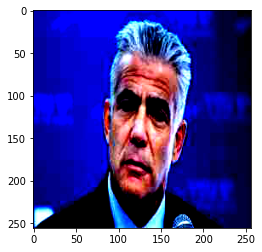

In [ ]:
tensor_image=image_datasets['val'][220][0]
plt.imshow(  tensor_image.permute(1, 2, 0)  )
image_datasets['val'][220][1]

In [ ]:
# Check for the availability of a GPU, and use CPU otherwise
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

### Datasets and Dataloaders
Let's examine the dataloaders and datasets and learn more about their attributes and functions.  

In [ ]:
train_dataloader = dataloaders['train']

In Colab or Jupyter notebook, if we type  `train_dataloader.` and wait, we'd see a drop-down with the object attributes and functions.  

`train_dataloader.dataset.samples` contains the filenames + true labels (0 to 8 for our 9 classes).  
`train_dataloader.dataset.classes` contains the class names in order.  
`train_dataloader.dataset.class_to_idx` contains a map from a class name to the integer that represents it.

In [ ]:
train_dataloader.dataset.class_to_idx

{'ayelet_shaked': 0,
 'benjamin_netanyahu': 1,
 'benny_gantz': 2,
 'danny_danon': 3,
 'gideon_saar': 4,
 'kostya_kilimnik': 5,
 'naftali_bennett': 6,
 'ofir_akunis': 7,
 'yair_lapid': 8}

### Visualize a few images

Let's visualize a few training images so as to understand the data
augmentations.



In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(means)
    std = np.array(stds)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(5,3), dpi=300)
    plt.imshow(inp)
    if title is not None:
       plt.title(title, fontsize=5)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
# Get a batch of training data - the data loader is a generator
inputs, classes = next(iter(dataloaders['train']))

`inputs` is a tensor of shape `[16, 3, 256, 256]` - there are 16 images in the batch, each with 3 color channels (RGB), a width of 256 pixels, and a height of 256 pixels:

In [ ]:
inputs.shape

torch.Size([16, 3, 256, 256])

In [ ]:
inputs

tensor([[[[ 1.5297,  1.5468,  1.5810,  ..., -0.7993, -0.7993, -0.7993],
          [ 1.5297,  1.5468,  1.5810,  ..., -0.7993, -0.7993, -0.7993],
          [ 1.5297,  1.5468,  1.5810,  ..., -0.8164, -0.8164, -0.8164],
          ...,
          [-1.8610, -1.6042, -1.2445,  ..., -1.5185, -1.7925, -2.0665],
          [-1.9124, -1.6727, -1.3130,  ..., -1.7240, -1.7069, -1.6898],
          [-1.9809, -1.7240, -1.3815,  ..., -1.9638, -1.9295, -1.8610]],

         [[ 1.7633,  1.7808,  1.8158,  ..., -0.9503, -0.9503, -0.9503],
          [ 1.7633,  1.7808,  1.8158,  ..., -0.9503, -0.9503, -0.9503],
          [ 1.7633,  1.7808,  1.8158,  ..., -0.9678, -0.9678, -0.9678],
          ...,
          [-1.5805, -1.3004, -0.9328,  ..., -1.4230, -1.7031, -1.9832],
          [-1.6331, -1.3880, -1.0028,  ..., -1.6331, -1.6155, -1.5980],
          [-1.6856, -1.4405, -1.0728,  ..., -1.8782, -1.8431, -1.7731]],

         [[ 2.0300,  2.0474,  2.0823,  ..., -1.0550, -1.0550, -1.0550],
          [ 2.0300,  2.0474,  

`classes` is a tensor of size 16, containing numbers matching the true class of each image, from our 9 classes.

In [ ]:
classes

tensor([6, 1, 2, 1, 2, 0, 4, 2, 1, 4, 1, 1, 0, 7, 0, 7])

To map it to the class names, we can run:

In [ ]:
[class_names[c] for c in classes]

['naftali_bennett',
 'benjamin_netanyahu',
 'benny_gantz',
 'benjamin_netanyahu',
 'benny_gantz',
 'ayelet_shaked',
 'gideon_saar',
 'benny_gantz',
 'benjamin_netanyahu',
 'gideon_saar',
 'benjamin_netanyahu',
 'benjamin_netanyahu',
 'ayelet_shaked',
 'ofir_akunis',
 'ayelet_shaked',
 'ofir_akunis']

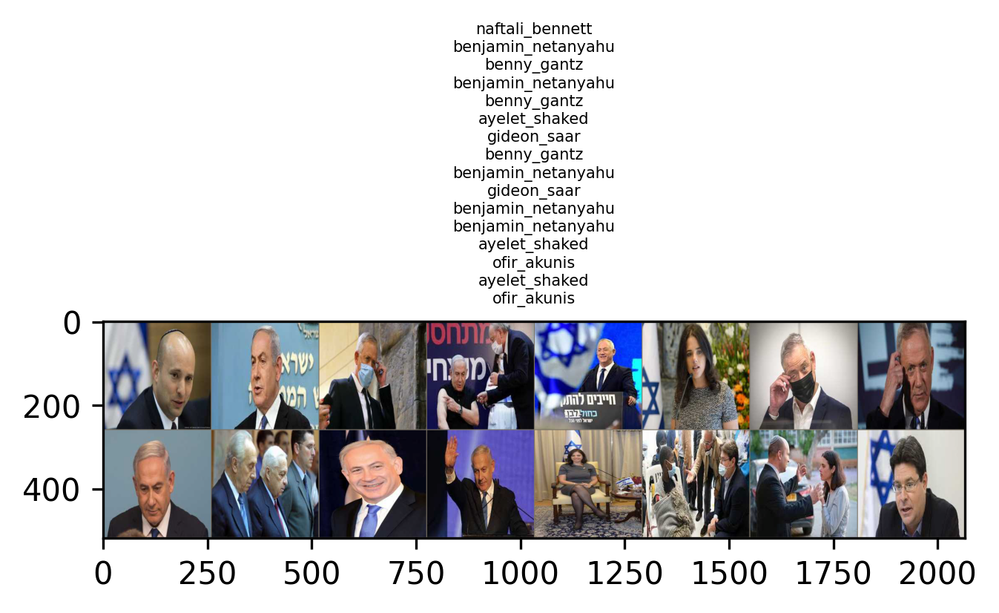

In [ ]:
# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=8)

imshow(out, title='\n'.join([class_names[x] for x in classes]))

### Using a pretrained model
Let's load a model pretrained on ImageNet, and use it for our task.  
The first time we load the model, it will be downloaded locally, and then cached for the future.

In [ ]:
# We load a pretrain model with its weights. Alternatively, one might want to only load the model architecture.
raw_model = models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


We can print the model to learn about its structure:

In [ ]:
raw_model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Keras has a useful model summary, that we can also use for PyTorch models:

In [ ]:
!pip install torchsummary 
from torchsummary import summary
summary(raw_model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

We can see above that the final layer is a fully connected layer, from 4096 neurons to 1000 neurons, with a total of `4096 * 1000 + 1000 = 4,097,000` parameters. We add 1000 weights for the bias term of each output neuron.  

So in total, VGG-16 has 138M parameters, and we've set them all to be trainable.

However, VGG-16 and other networks created for ImageNet all have 1,000 neurons in their output, since they classify images to one of the 1,000 categories in the ImageNet challenge.  
To use the network for our task, we need to replace the final fully-connected layer with one mapping to 9 neurons instead of 1000:

In [ ]:
# This code should output the number of input neurons to the final layer. We'll use it to create a new layer instead of it.
def get_in_features(model):
  last_layer = list(model.children())[-1]
  if hasattr(last_layer, 'in_features'):
    num_ftrs = last_layer.in_features
  else:
    num_ftrs = last_layer[-1].in_features
  return num_ftrs
num_ftrs = get_in_features(raw_model)
num_ftrs

4096

To access and set a layer in the network, we reference it by name. In the example above, the final layer is `model.classifier[6]`.

In [ ]:
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
len(raw_model.classifier)

7

Let's now replace it with a linear layer with 4096 input features and 9 output features:

In [ ]:
raw_model.classifier[6] = nn.Linear(in_features=num_ftrs, out_features=9)

Let's review our change in the model:

In [ ]:
raw_model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
summary(raw_model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

Next, we define the loss, optimizer and LR scheduler.

In [ ]:
# If a GPU is available, make the model use it
raw_model = raw_model.to(device)

# For a multi-class problem, you'd usually prefer CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
optimizer_ft = optim.SGD(raw_model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 10

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [ ]:
LOSS=0
ACC=1

def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, verbose=True):
    since = time.time()
    train_res= np.zeros((2,num_epochs))
    val_res=np.zeros((2,num_epochs))
    dict_res={'train':train_res, 'val':val_res}

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in tqdm(range(num_epochs)):
        if verbose:
        
          print('Epoch {}/{}'.format(epoch, num_epochs - 1))
          print('-' * 10)
          

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer

                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
            if phase == 'train':
                # Adjust the learning rate based on the scheduler
                scheduler.step()  

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            if verbose:
              print()
              print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
             
            dict_res[phase][LOSS,epoch]=epoch_loss
            dict_res[phase][ACC,epoch]=epoch_acc

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())

       

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, dict_res

## Finetuning the network




### Train and evaluate
It should take around 15-25 min on CPU. On GPU though, it takes less than a minute.

In [ ]:
vgg_model, dict_res = train_model(raw_model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------

train Loss: 1.7675 Acc: 0.3563


 10%|█         | 1/10 [00:19<02:51, 19.03s/it]


val Loss: 1.4394 Acc: 0.4615
Epoch 1/9
----------

train Loss: 1.0116 Acc: 0.6545


 20%|██        | 2/10 [00:38<02:33, 19.13s/it]


val Loss: 0.9508 Acc: 0.6453
Epoch 2/9
----------

train Loss: 0.5660 Acc: 0.8181


 30%|███       | 3/10 [00:57<02:14, 19.24s/it]


val Loss: 0.8616 Acc: 0.6880
Epoch 3/9
----------

train Loss: 0.2872 Acc: 0.9117


 40%|████      | 4/10 [01:17<01:56, 19.42s/it]


val Loss: 0.8228 Acc: 0.7436
Epoch 4/9
----------

train Loss: 0.1221 Acc: 0.9688


 50%|█████     | 5/10 [01:37<01:38, 19.66s/it]


val Loss: 0.8210 Acc: 0.7692
Epoch 5/9
----------

train Loss: 0.0762 Acc: 0.9806


 60%|██████    | 6/10 [01:58<01:19, 19.84s/it]


val Loss: 1.1059 Acc: 0.7350
Epoch 6/9
----------

train Loss: 0.0772 Acc: 0.9752


 70%|███████   | 7/10 [02:18<00:59, 19.87s/it]


val Loss: 0.9361 Acc: 0.7521
Epoch 7/9
----------

train Loss: 0.0504 Acc: 0.9839


 80%|████████  | 8/10 [02:38<00:39, 19.90s/it]


val Loss: 0.7662 Acc: 0.8034
Epoch 8/9
----------

train Loss: 0.0213 Acc: 0.9946


 90%|█████████ | 9/10 [02:58<00:19, 19.94s/it]


val Loss: 0.7971 Acc: 0.7906
Epoch 9/9
----------

train Loss: 0.0162 Acc: 0.9957


100%|██████████| 10/10 [03:18<00:00, 19.82s/it]


val Loss: 0.8048 Acc: 0.7906
Training complete in 3m 18s
Best val Acc: 0.803419


### Visualizing the model predictions

Let's define a generic function to display our model's predictions for a few images:




In [ ]:
def visualize_model(model, num_images=6):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1

                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)

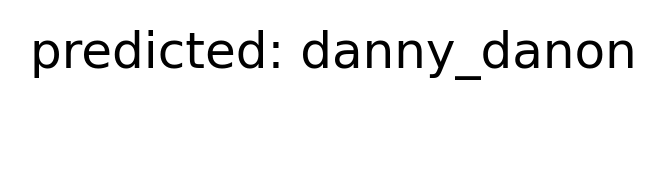

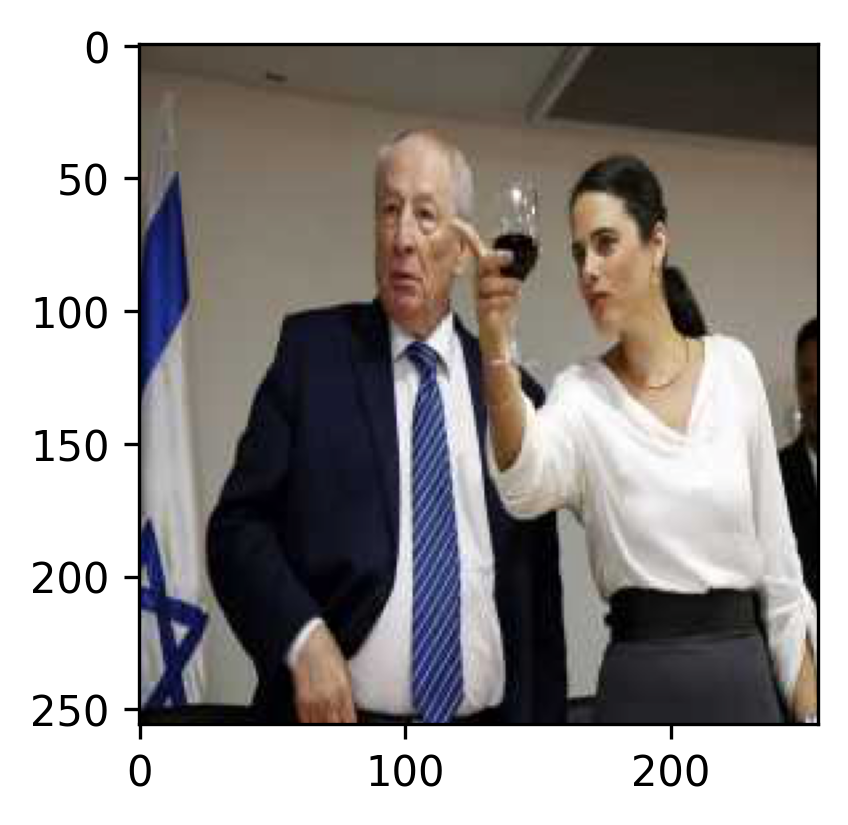

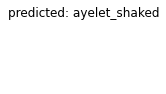

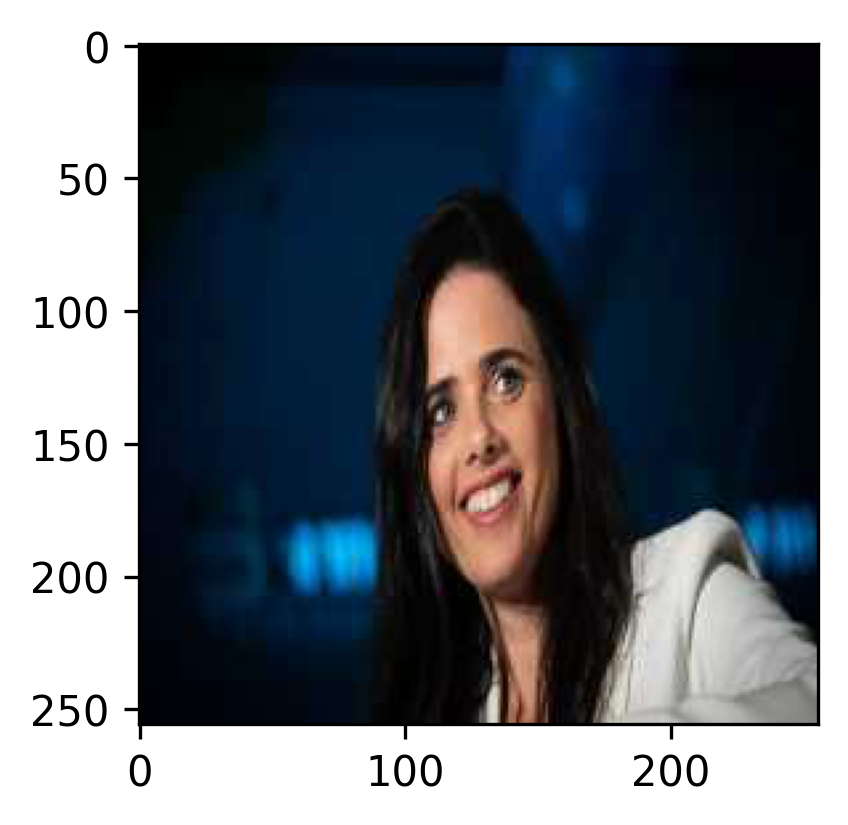

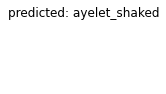

...

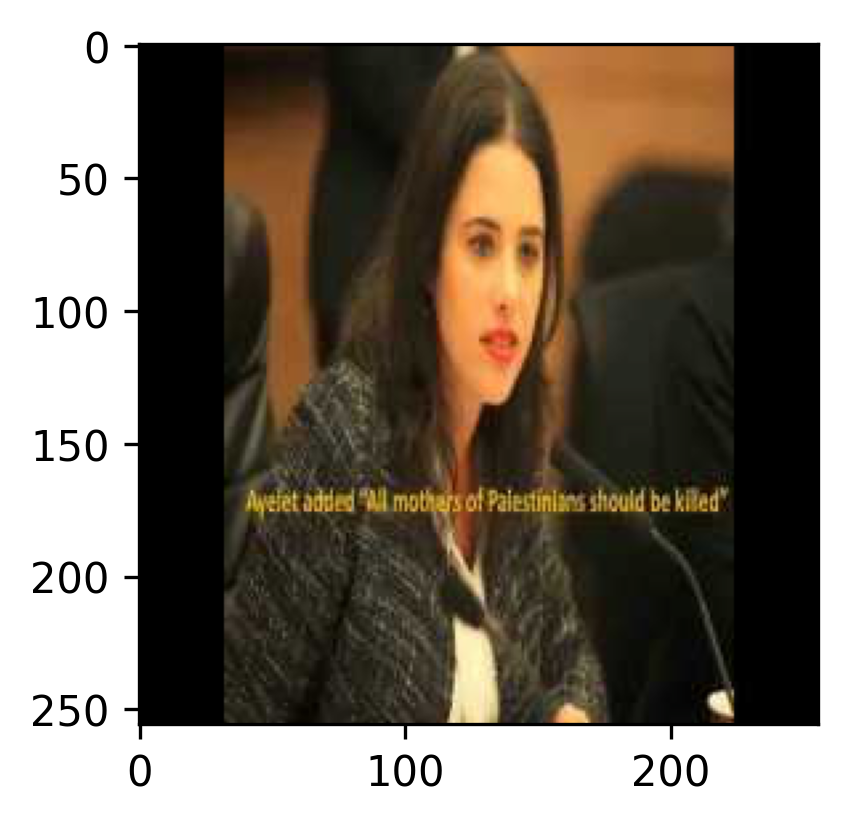

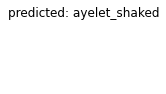

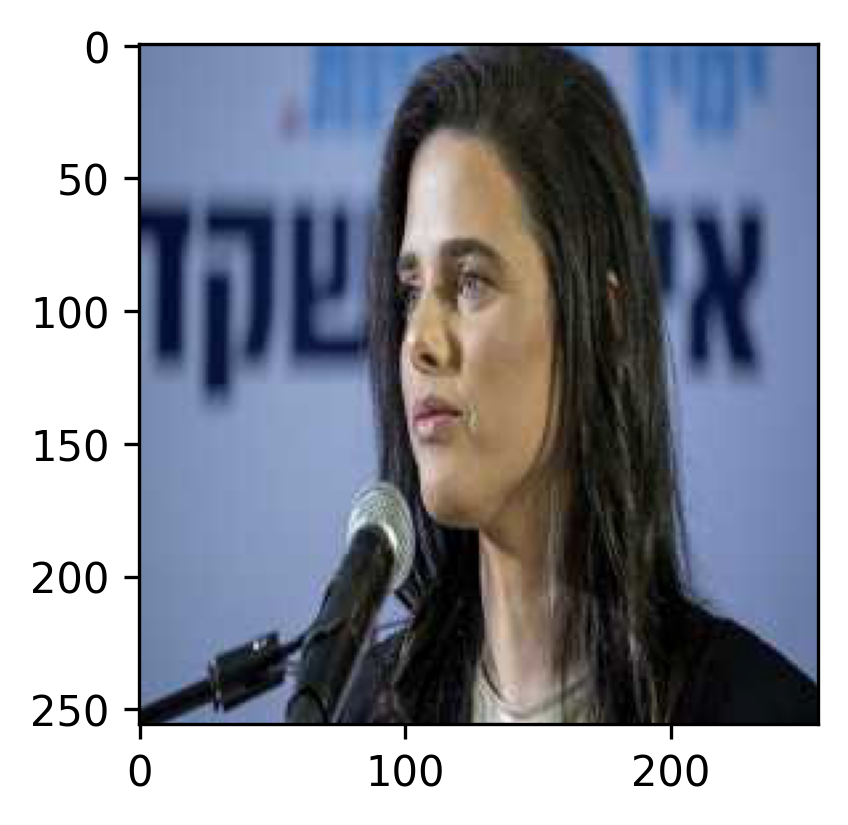

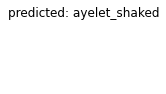

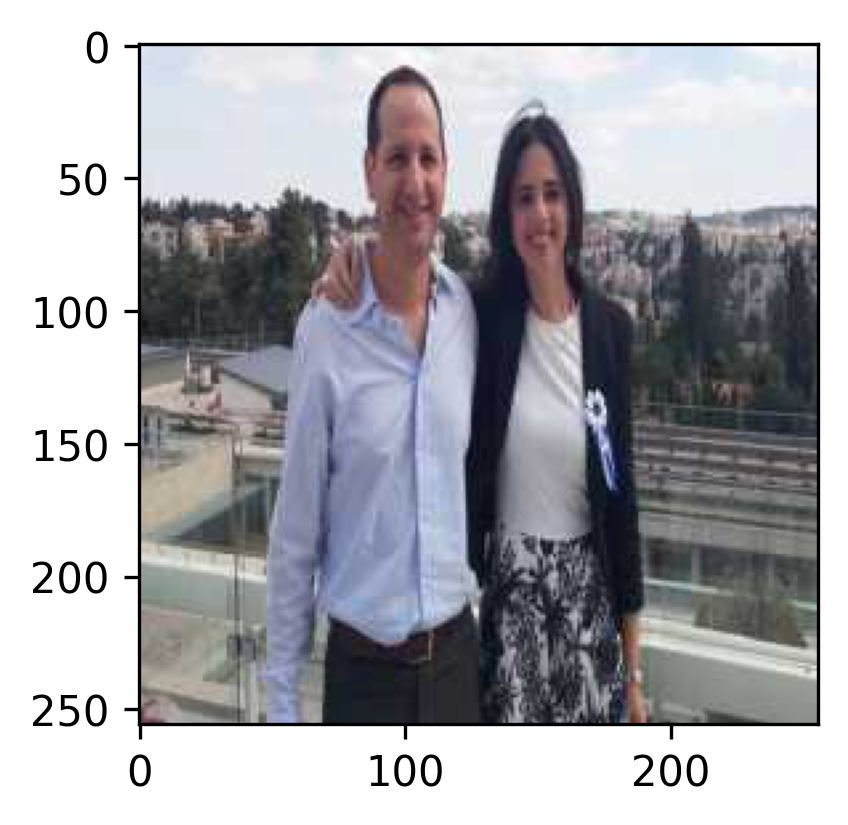

In [ ]:
visualize_model(vgg_model)

# Additional Tasks
In the sections below, you'll experiment with PyTorch and NN yourself.  

Before you start having fun on your own, let's review together how to get some predictions from our trained model.  

As we've done in both our training and visualization code, we apply the model to input with the command:  
```python
outputs = model(inputs)
```

The relevant code:

In [ ]:
inputs, labels = next(iter(dataloaders['train']))
inputs = inputs.to(device)
print(inputs)

labels = labels.to(device)
print(labels)

tensor([[[[ 0.0398,  0.0398,  0.0569,  ...,  0.8447,  0.8104,  0.7933],
          [ 0.0398,  0.0398,  0.0569,  ...,  0.8447,  0.8104,  0.8104],
          [ 0.0569,  0.0569,  0.0741,  ...,  0.8618,  0.8276,  0.8104],
          ...,
          [-0.4054, -0.2856, -0.1486,  ...,  0.8104,  0.8104,  0.9132],
          [-0.3198, -0.2513, -0.1143,  ...,  0.7762,  0.7591,  0.8276],
          [-0.2856, -0.2342, -0.1143,  ...,  0.9817,  0.7591,  0.6906]],

         [[ 0.3803,  0.3978,  0.4153,  ...,  1.0105,  0.9755,  0.9580],
          [ 0.3803,  0.3978,  0.4153,  ...,  1.0105,  0.9755,  0.9755],
          [ 0.3978,  0.4153,  0.4328,  ...,  1.0280,  0.9930,  0.9755],
          ...,
          [-0.8803, -0.8627, -0.8452,  ...,  0.7304,  0.7304,  0.8179],
          [-0.8627, -0.8452, -0.8452,  ...,  0.6429,  0.6254,  0.6954],
          [-0.8627, -0.8627, -0.8627,  ...,  0.8529,  0.6254,  0.5203]],

         [[ 0.8797,  0.8971,  0.9145,  ...,  1.1411,  1.1062,  1.0888],
          [ 0.8797,  0.8971,  

Note that we got tensors. We can convert them into numpy objects. Since we've previously set them to use GPU, We'll need to set them to use CPU first:

In [ ]:
labels.cpu().numpy()

array([7, 0, 2, 2, 8, 7, 6, 1, 1, 1, 7, 0, 4, 7, 1, 4])

In [ ]:
outputs = raw_model(inputs)

print(outputs.shape)
print(outputs)

torch.Size([16, 9])
tensor([[ -2.3722,  -7.1907,  -5.5381,   4.2317,   0.6130,  -1.8677,  -4.4658,
          23.1445,  -2.3464],
        [ 13.9872,  -8.1142,  -6.8021,   5.7932,  -1.2945,   0.2913,  -1.3356,
          -1.2565,   1.8012],
        [ -3.9143,   2.7993,  11.9749,  -4.4980,   2.4209,  -3.1999,  -0.3846,
          -2.5200,  -0.7166],
        [ -5.4760,   4.9965,  14.5451,  -4.2111,   4.2988,  -3.7625,  -2.7124,
          -4.1230,   0.3651],
        [  0.6982,  -2.7838,   0.2907,  -3.0089,   0.7681,  -2.1571,  -6.0316,
           2.9701,  12.1029],
        [ -4.1116,  -0.7202,   0.2065,   0.4231,   3.1545,  -3.2020,  -2.5846,
           8.1014,   1.9836],
        [  1.7702,  -0.8483,  -1.2793,  -0.6083,  -0.4555,  -3.1959,   8.2491,
          -0.9116,  -1.9936],
        [ -7.4132,  18.2535,   6.1836,  -5.6499,   2.8701,  -7.6787,   1.8346,
          -6.0421,  -0.0469],
        [ -8.0516,  18.7681,   1.8206,  -0.4516,   8.2024,  -4.3429,  -2.1035,
         -10.0128,  -1.8906],

Note that `outputs` have 16 "rows", one for each of the images in our batch, and each "row" has 9 values, for each of our classes.  
The values are the activations of the neurons, before applying the softmax function to them. To apply the softmax function to them, we can run:

In [ ]:
torch.nn.functional.softmax(outputs, dim=1).cpu().detach().numpy()

array([[8.28362205e-12, 6.69252997e-14, 3.49375666e-13, 6.11359896e-09,
        1.63950270e-10, 1.37199410e-11, 1.02093139e-12, 1.00000000e+00,
        8.50054749e-12],
       [9.99716818e-01, 2.51983184e-10, 9.35881150e-10, 2.76222330e-04,
        2.30737925e-07, 1.12677310e-06, 2.21456645e-07, 2.39682919e-07,
        5.10005930e-06],
       [1.25696275e-07, 1.03517923e-04, 9.99817193e-01, 7.01176788e-08,
        7.09000087e-05, 2.56787217e-07, 4.28790918e-06, 5.06824222e-07,
        3.07640653e-06],
       [2.01773442e-09, 7.12879555e-05, 9.99892473e-01, 7.14872916e-09,
        3.54815784e-05, 1.11957412e-08, 3.19969189e-08, 7.80728993e-09,
        6.94425921e-07],
       [1.11418440e-05, 3.42545860e-07, 7.41229223e-06, 2.73515496e-07,
        1.19488486e-05, 6.41075246e-07, 1.33115403e-08, 1.08048916e-04,
        9.99860287e-01],
       [4.91430410e-06, 1.45993487e-04, 3.68813693e-04, 4.58015100e-04,
        7.03216670e-03, 1.22040583e-05, 2.26270458e-05, 9.89774585e-01,
        2.1

## Task 1: Plot model convergence
Adapt the code above to plot the loss and the accuracy every epoch. Show both the training and the validation performance.  
Does our model overfit?  
Do you have suggestions following these graphs? 

In [ ]:
def plot_convergence(dict_res, num_epochs, model_name='vgg16'):
  fig, axes = plt.subplots(1, 2, figsize=(14,4))
  types=['Loss', 'Accuracy']
  for i in [0,1]:
    axes[i].plot(np.arange(num_epochs),dict_res['train'][i])
    axes[i].plot(np.arange(num_epochs),dict_res['val'][i])
    axes[i].legend(['train','val'])
    axes[i].set_title(model_name + ': '+ types[i] + " accroding to epochs")
    axes[i].set_xlabel("Num of epochs")
    axes[i].set_ylabel(types[i])


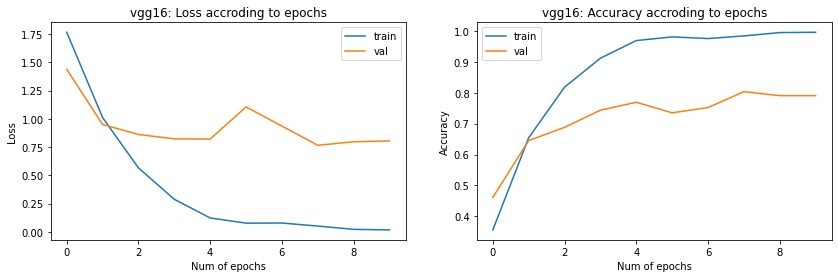

In [ ]:
plot_convergence(dict_res,num_epochs )

The model overfits as seen from the large difference in accruracy between validation and train scores.Overfitting starts after 2-3 epochs. Possible remedies could be stronger regularization and adding more data along with error analysis.

## Task 2: Evaluate the model performance
Write code that shows the performance of our model.  
Show the classification report and the confusion matrix.  

What can you say about the model so far?  
Can you suggest a few ideas to improve it?

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
def assess_model(model):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    plt.figure(figsize=(2,1), dpi=300)
    preds = []
    labels_list = []
    max_vals=[]
    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)
            labels_list.append(labels.cpu().numpy())

            outputs = model(inputs)

            _, pred = torch.max(outputs, 1)
            preds.append(pred.cpu().numpy())
            probs=torch.nn.functional.softmax(outputs, dim=1).cpu().detach().numpy()
            max_vals.append(np.max(probs, axis=1))
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)
        #print(outputs[0], pred[0], vals[0])
        return labels_list, preds, max_vals



In [ ]:
# add function that builds the ConfusionMatrix and classification_report in the same block as assess_model

In [ ]:
labels, preds, probs = assess_model(vgg_model)

<Figure size 600x300 with 0 Axes>

In [ ]:
y_true = np.concatenate(labels) 
y_pred = np.concatenate(preds)
probs= np.concatenate(probs)
print(classification_report(y_true, y_pred,target_names=class_names))

                    precision    recall  f1-score   support

     ayelet_shaked       0.88      0.92      0.90        24
benjamin_netanyahu       0.78      0.79      0.79        58
       benny_gantz       0.79      0.50      0.61        22
       danny_danon       0.81      0.95      0.88        22
       gideon_saar       0.74      0.83      0.78        24
   kostya_kilimnik       0.75      1.00      0.86         3
   naftali_bennett       0.71      0.65      0.68        23
       ofir_akunis       0.93      0.82      0.87        34
        yair_lapid       0.79      0.92      0.85        24

          accuracy                           0.80       234
         macro avg       0.80      0.82      0.80       234
      weighted avg       0.81      0.80      0.80       234



In [ ]:
cm = confusion_matrix(y_true, y_pred)
print(cm)


[[22  0  0  1  0  0  1  0  0]
 [ 0 46  1  2  4  0  0  1  4]
 [ 0  6 11  0  1  0  3  0  1]
 [ 0  0  0 21  0  0  0  1  0]
 [ 0  1  0  2 20  0  0  0  1]
 [ 0  0  0  0  0  3  0  0  0]
 [ 2  4  1  0  0  1 15  0  0]
 [ 1  0  1  0  2  0  2 28  0]
 [ 0  2  0  0  0  0  0  0 22]]


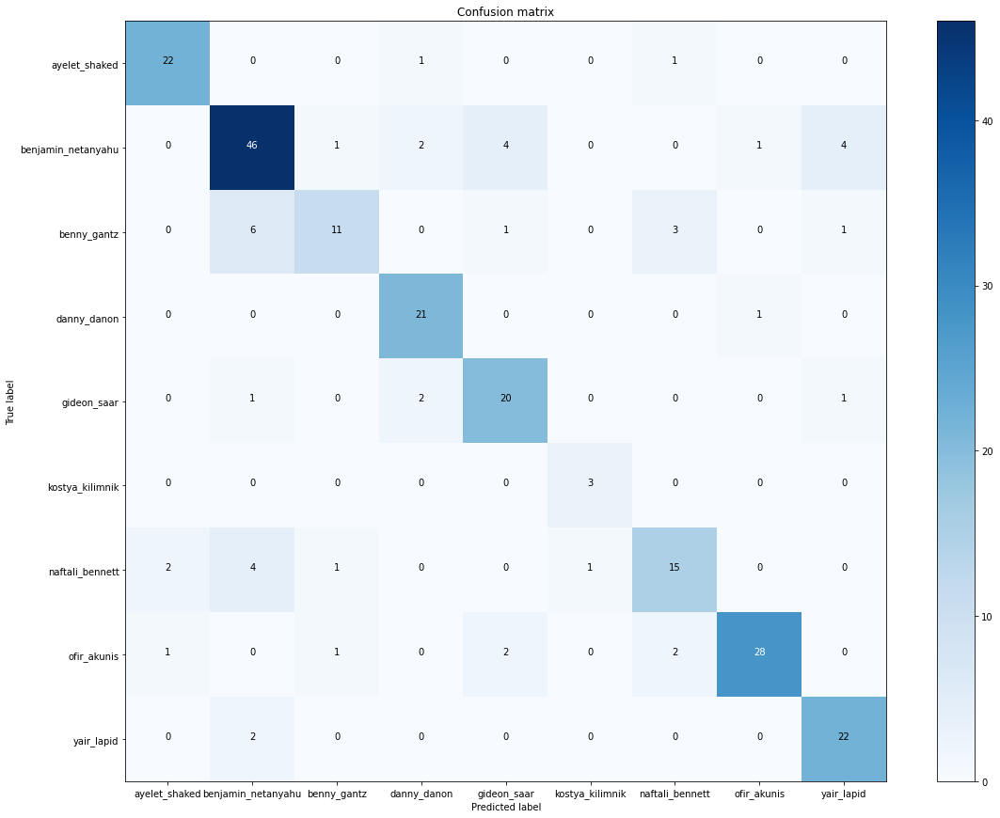

In [ ]:
import itertools

def plot_confusion_matrix(cm,
                          target_names,
                          normalize=True):

    plt.figure(figsize=(16, 12))
    plt.imshow(cm, interpolation='nearest', cmap='Blues')
    plt.title('Confusion matrix')
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
plot_confusion_matrix(cm,class_names, False)

In the report we see 4 'problematic' - Ganz, Bennet, Saar and Kostia - who have low precision and/or recall rate. From the matrix we understand that some of these errors are related to missclassification of these persons (espcially Ganz) as Netanyahu which may stem from over-representation of Netanyahu in the training data (as shown from the histogram below). Another source of errors seen in that bar plot is under-representation of Kostia in the training data.One good solution for these errors will be simply to ensure balanced data - either by adding more pictures to Kostia and the others (or under-samplling pictures of Netanyahu).

<BarContainer object of 9 artists>

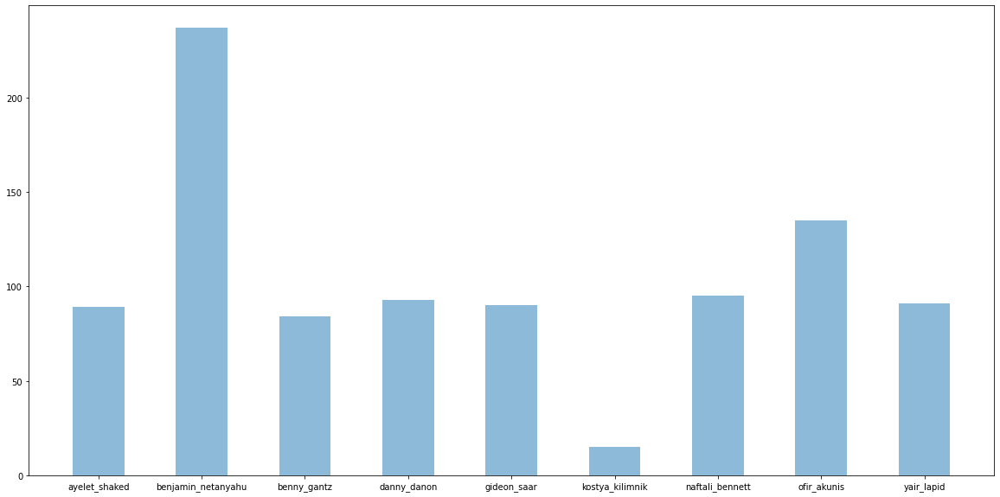

In [ ]:
lbls=[image_datasets['train'][x][1] for x in range(len(image_datasets['train']))]
#plt.hist(lbls,bins=8, label=class_names)
bc=np.bincount(lbls)
fig = plt.figure(figsize=(20,10))

plt.bar(class_names, bc, align="center", width=0.5, alpha=0.5)

## Task 3: Perform Error Analysis 
Error Analysis is an extremely important practice in Machine Learning research. It is rare that our base model works great out of the box. Proper error analysis helps us detect and fix issues in our DL code, data preprocessing and even in the data itself.

#### Review examples of top errors
One of the basic techniques of Error Analysis is manually reviewing the top errors of the model - samples where the model was most confident about one class, but the true label was different.  
Plot the top 10 errors of the model for each true class.  
Do you spot any issue or pattern?  
Try to see if you can improve the performance of the model following your insights.

(41, 5)


,true,pred,proba,labels,preds
174,naftali_bennett,kostya_kilimnik,0.999309,6,5
91,benny_gantz,benjamin_netanyahu,0.988884,2,1
149,gideon_saar,benjamin_netanyahu,0.988262,4,1
45,benjamin_netanyahu,gideon_saar,0.982978,1,4
53,benjamin_netanyahu,benny_gantz,0.977639,1,2
161,naftali_bennett,benjamin_netanyahu,0.972112,6,1
154,naftali_bennett,benny_gantz,0.960768,6,2
88,benny_gantz,benjamin_netanyahu,0.948918,2,1
215,yair_lapid,benny_gantz,0.940195,8,2
158,naftali_bennett,benny_gantz,0.914006,6,2


<Figure size 720x720 with 0 Axes>

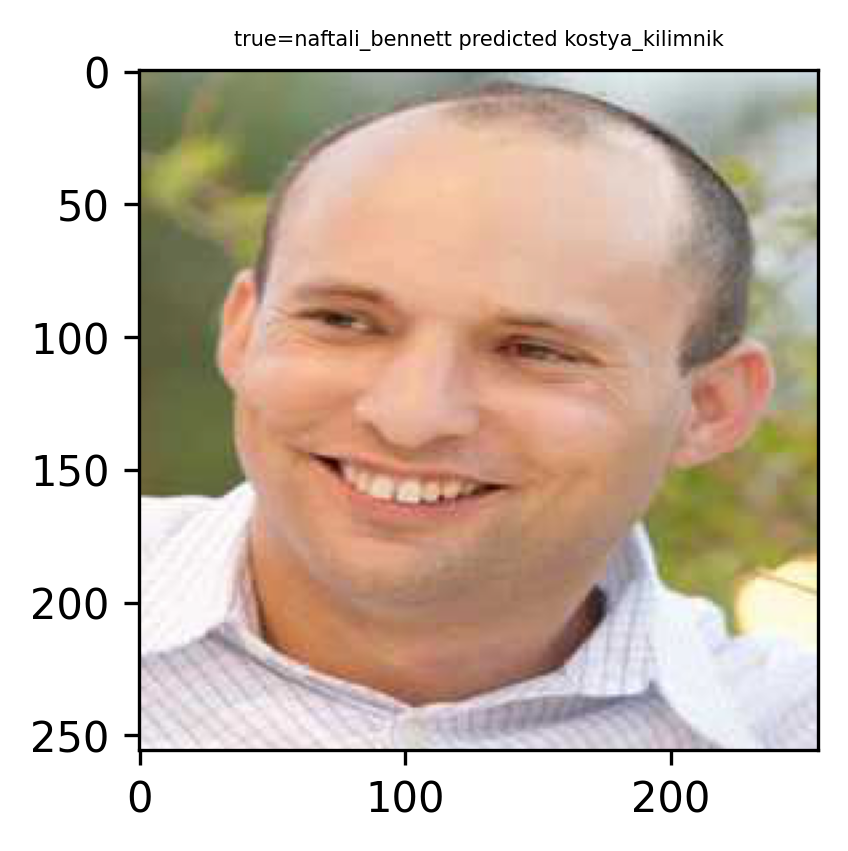

<Figure size 720x720 with 0 Axes>

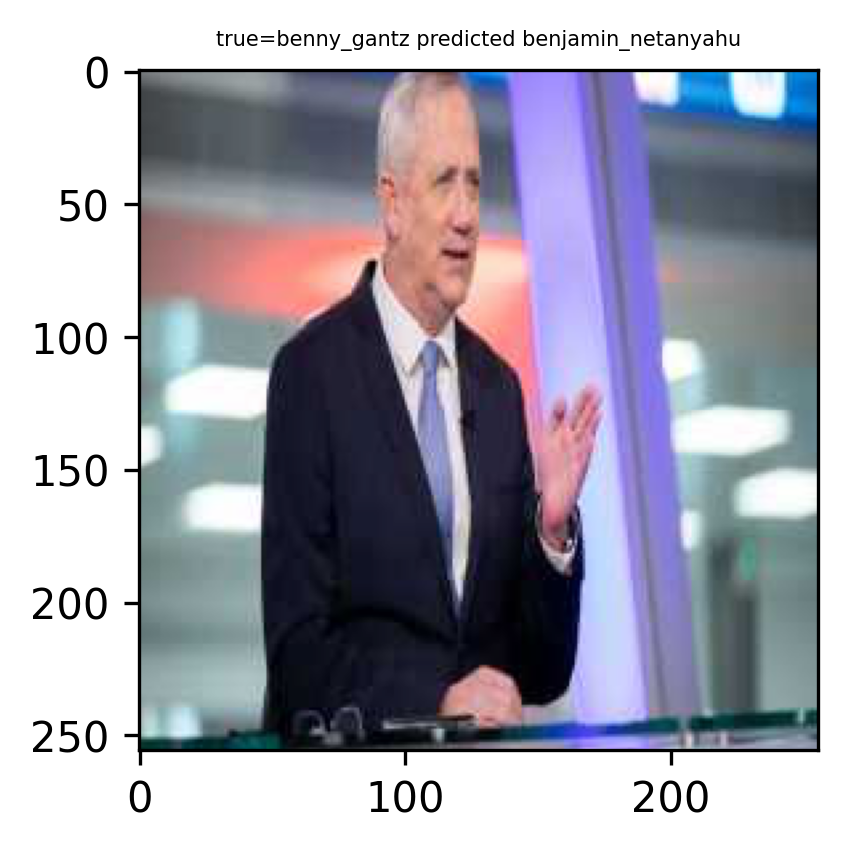

<Figure size 720x720 with 0 Axes>

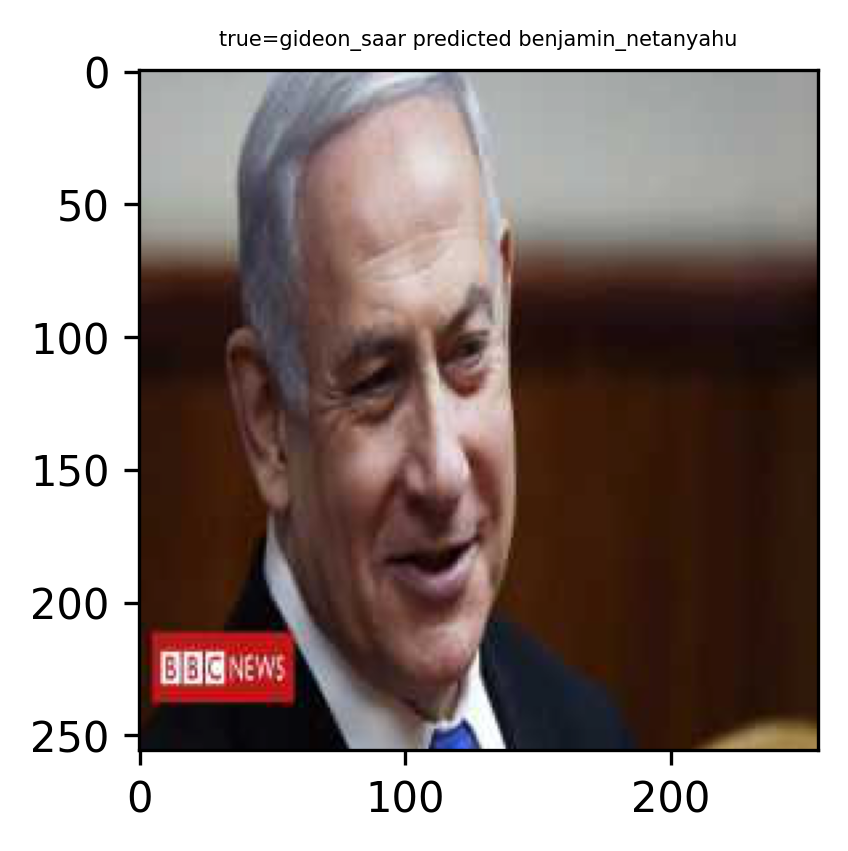

<Figure size 720x720 with 0 Axes>

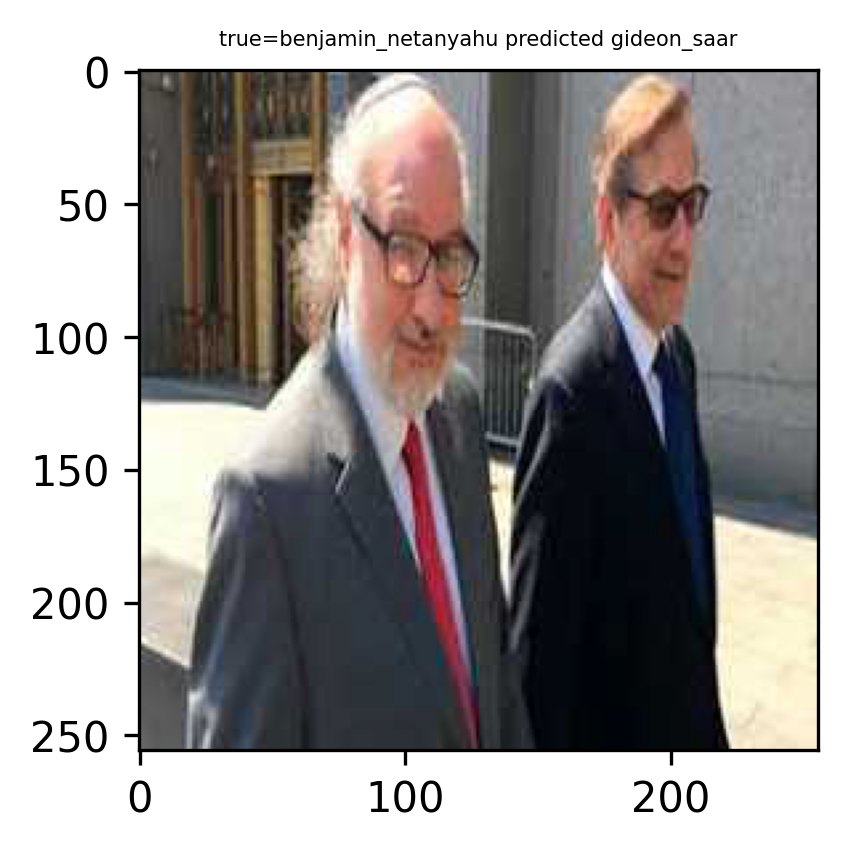

<Figure size 720x720 with 0 Axes>

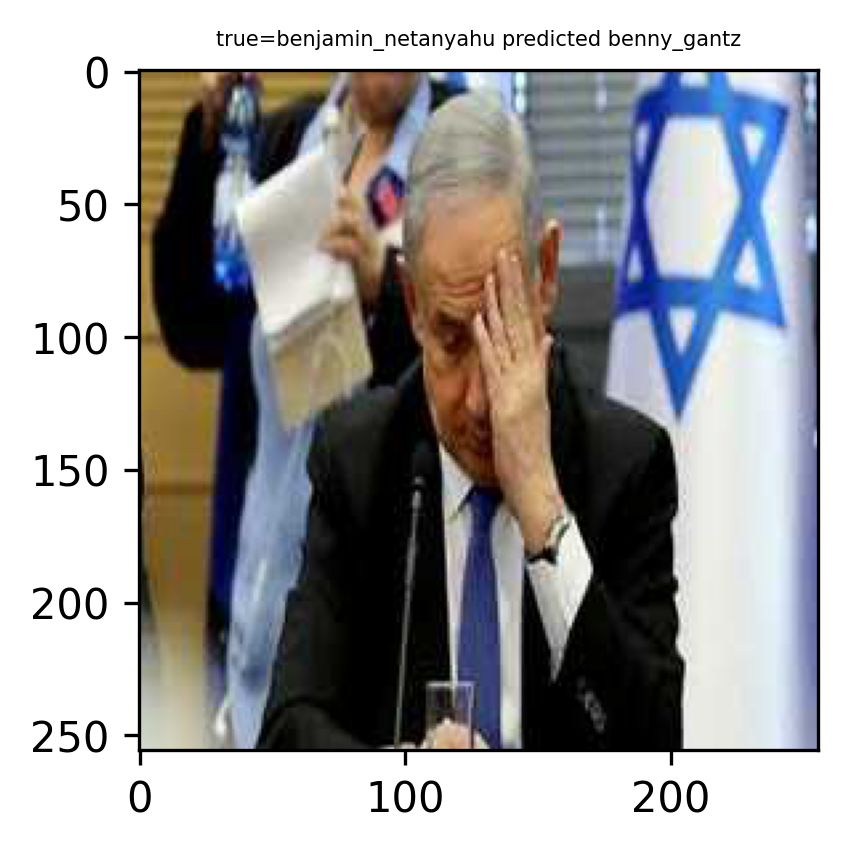

<Figure size 720x720 with 0 Axes>

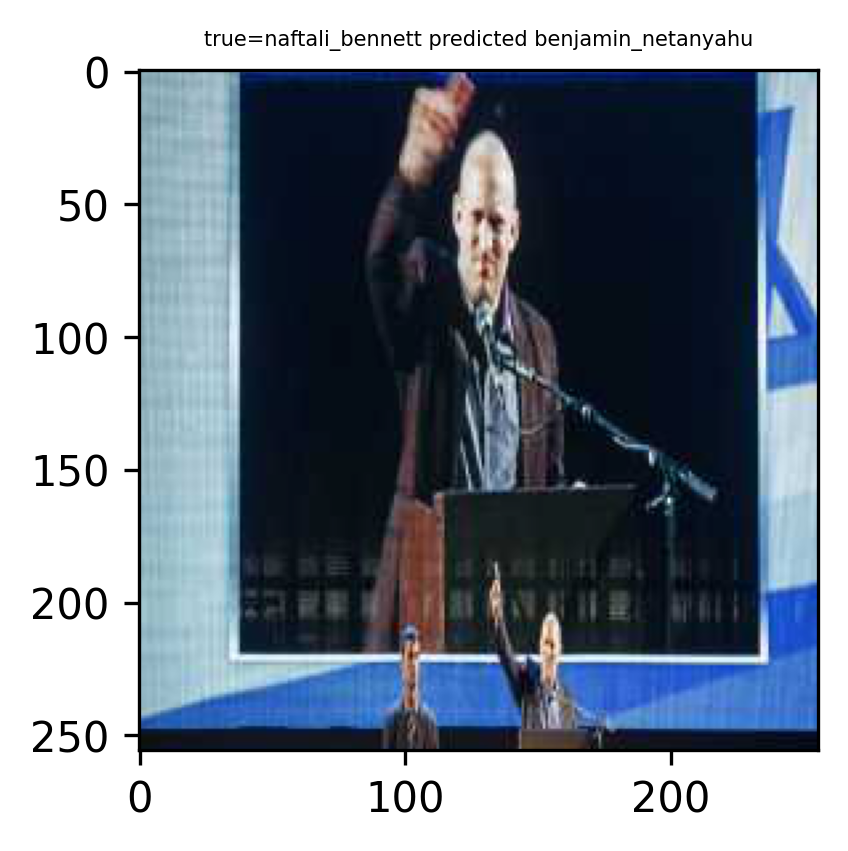

<Figure size 720x720 with 0 Axes>

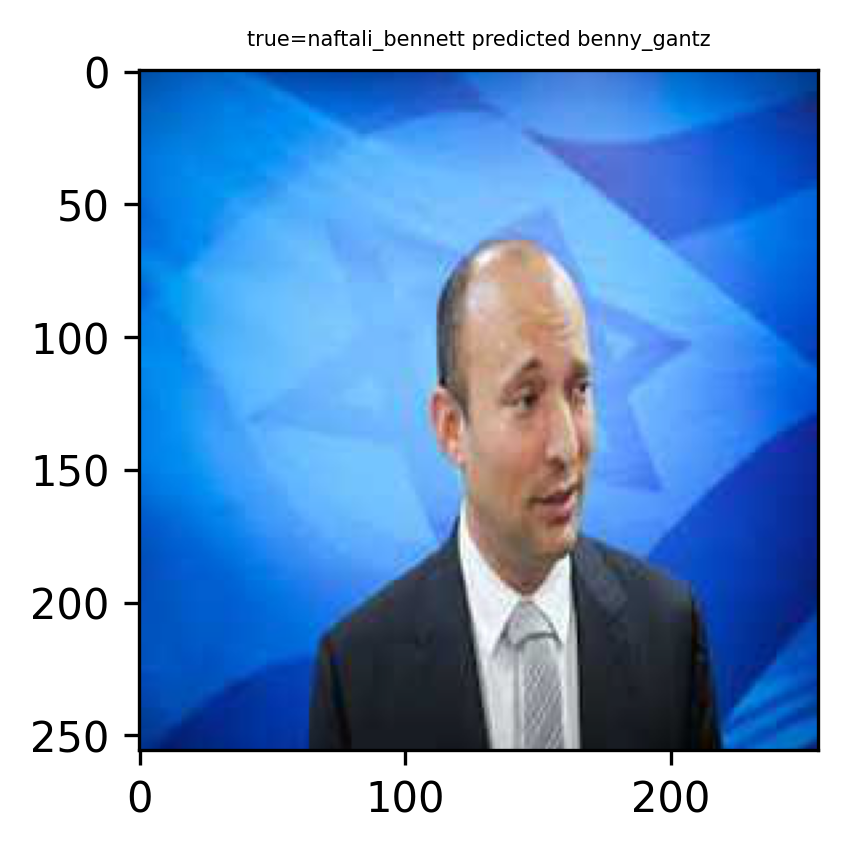

<Figure size 720x720 with 0 Axes>

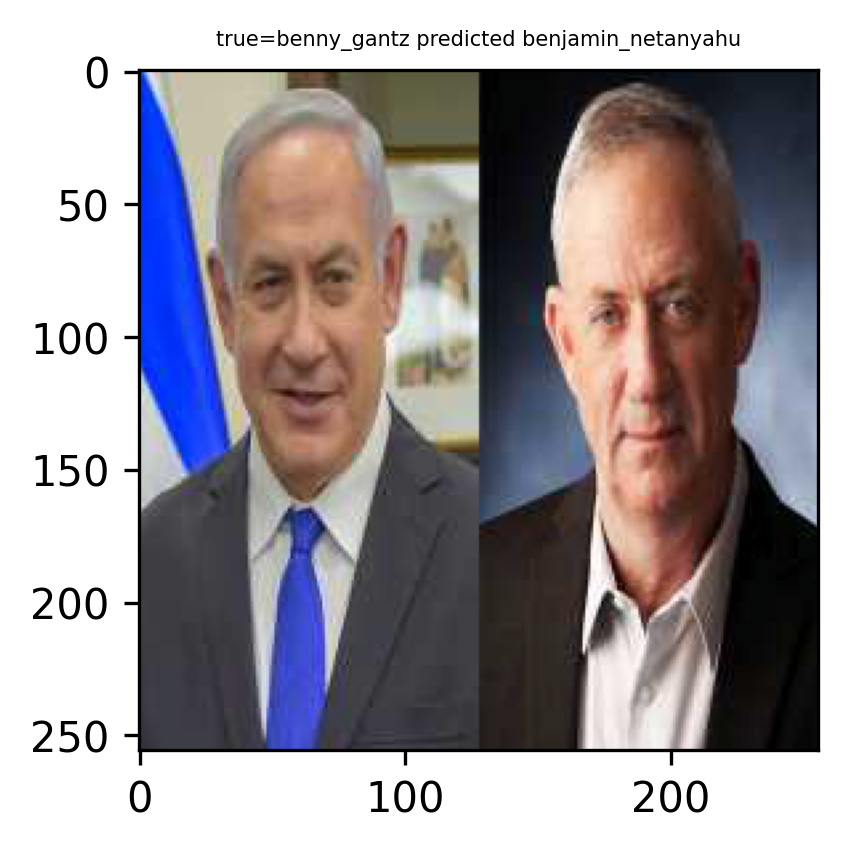

<Figure size 720x720 with 0 Axes>

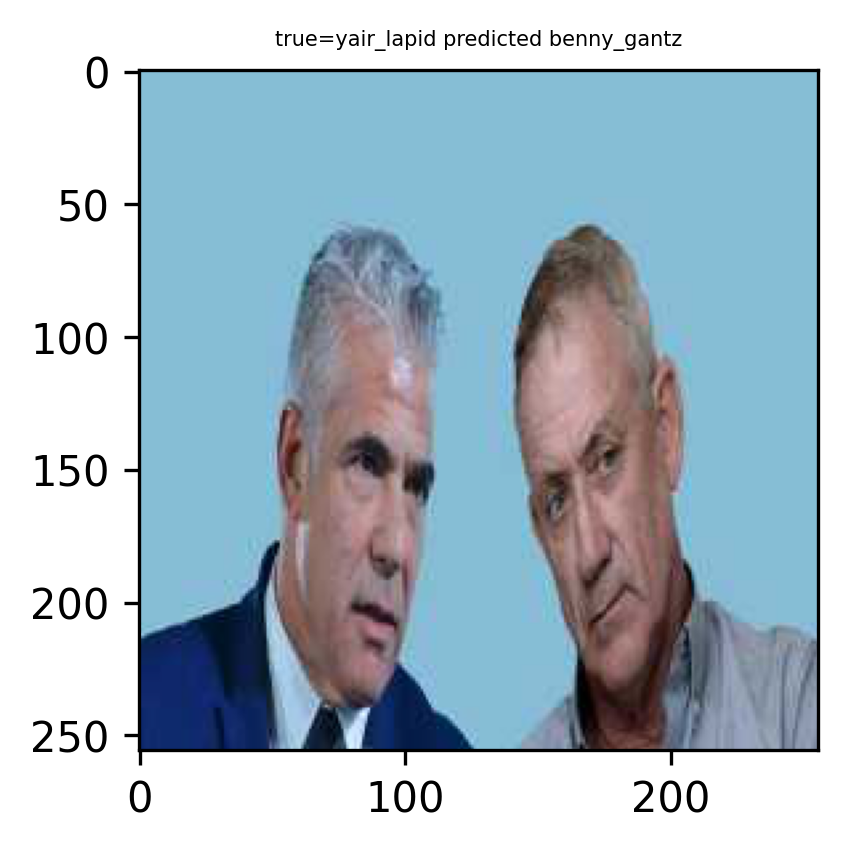

<Figure size 720x720 with 0 Axes>

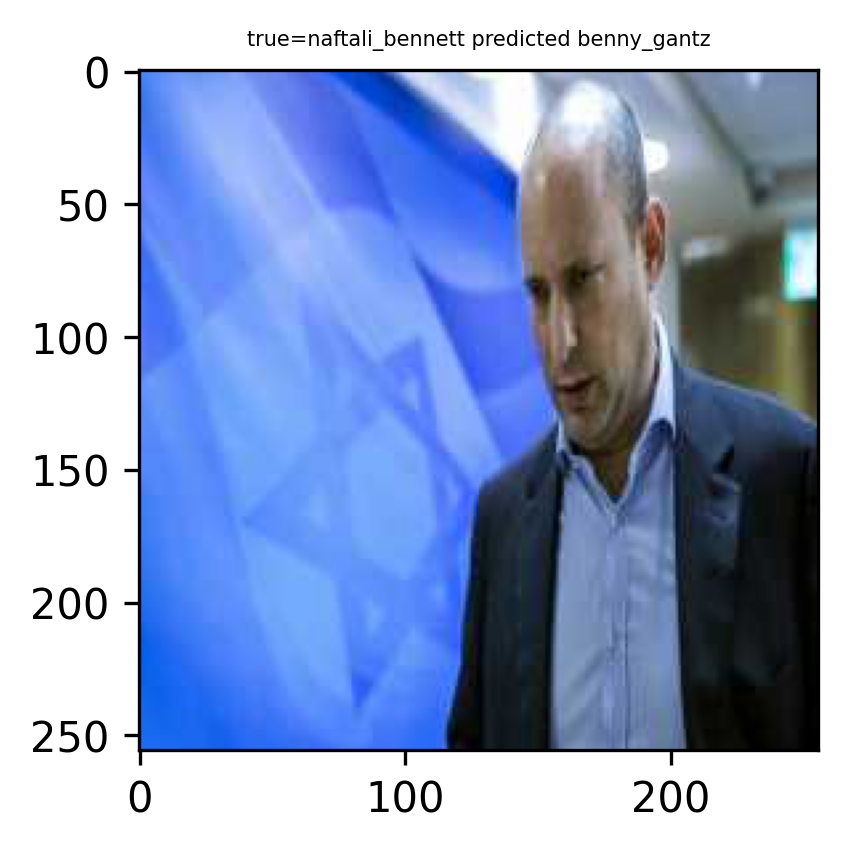

In [ ]:
 
import pandas as pd
true_person=[class_names[i] for i in y_true]
pred_person=[class_names[i] for i in y_pred]
dict={ 'true':true_person,'pred':pred_person,'proba':probs,'labels':y_true, 'preds':y_pred}
df=pd.DataFrame(dict)

df_error= df[df.labels!=df.preds]
df_error= df_error.sort_values(by='proba', ascending= False)#inplace=False)
print(df_error.shape)
display(df_error)
err_indi = df_error.index.values[0:10]

j=1
for i in err_indi:
  fig= plt.figure(figsize=(10,10)) #30,10
  title = 'true='+ df_error.loc[i,'true'] + ' predicted ' + df_error.loc[i,'pred']
  tensor_image=image_datasets['val'][i][0]
 # ax = fig.add_subplot(2, 5, j)
  #plt.imshow(  tensor_image.permute(1, 2, 0)  )
  imshow(tensor_image, title)
  #plt.title(title) # set title
  j=j+1

From analysing the top errors we can spot some problems with the validation data - some pictures are ambigious (contain 2 persons from the targets), some lables are wrong. some pictures are blurred, etc. 
possible solutions - filter out the bad pictures, perform the same error analysis on train data as well to spot bad pictures, train with blurred pictures.

## Task 4: NN as a fixed feature extractor

Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad == False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation [here](https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward).




In [ ]:
 
def frozen_model():
  model = models.vgg16(pretrained=True)
  for param in model.parameters():
      param.requires_grad = False
# Replace the last fully-connected layer
# Parameters of newly constructed modules have requires_grad=True by default
#print(model)# = nn.Linear(512, 100)
  model.classifier[6] = nn.Linear(in_features=4096, out_features=9)
  model.to(device)
  optimizer_ft = optim.SGD(model.classifier[6].parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
  exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
  return model, optimizer_ft, exp_lr_scheduler
frozen, optimizer_ft, exp_lr_scheduler= frozen_model()
summary(frozen.to(device), (3, 256, 256))
 

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

In [ ]:
# sanity check to verify that only last layer is trainable
for name,param in frozen.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

	 classifier.6.weight
	 classifier.6.bias


### Train and evaluate

On CPU this will take about half the time compared to previous scenario. This is expected as gradients don't need to be computed for most of the network. However, forward does need to be computed.

In [ ]:
frz_model, dict_res = train_model(frozen, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------

train Loss: 1.8996 Acc: 0.3219


 10%|█         | 1/10 [00:08<01:13,  8.22s/it]


val Loss: 1.5917 Acc: 0.4402
Epoch 1/9
----------

train Loss: 1.5204 Acc: 0.4639


 20%|██        | 2/10 [00:16<01:05,  8.23s/it]


val Loss: 1.4992 Acc: 0.4658
Epoch 2/9
----------

train Loss: 1.3750 Acc: 0.5199


 30%|███       | 3/10 [00:24<00:57,  8.27s/it]


val Loss: 1.3646 Acc: 0.5385
Epoch 3/9
----------

train Loss: 1.2865 Acc: 0.5436


 40%|████      | 4/10 [00:33<00:49,  8.26s/it]


val Loss: 1.3577 Acc: 0.5641
Epoch 4/9
----------

train Loss: 1.1953 Acc: 0.5920


 50%|█████     | 5/10 [00:41<00:41,  8.24s/it]


val Loss: 1.3420 Acc: 0.5427
Epoch 5/9
----------

train Loss: 1.1816 Acc: 0.5845


 60%|██████    | 6/10 [00:49<00:33,  8.28s/it]


val Loss: 1.3136 Acc: 0.5641
Epoch 6/9
----------

train Loss: 1.1415 Acc: 0.6157


 70%|███████   | 7/10 [00:57<00:24,  8.26s/it]


val Loss: 1.3385 Acc: 0.5598
Epoch 7/9
----------

train Loss: 1.0302 Acc: 0.6286


 80%|████████  | 8/10 [01:06<00:16,  8.30s/it]


val Loss: 1.2807 Acc: 0.5641
Epoch 8/9
----------

train Loss: 1.0333 Acc: 0.6588


 90%|█████████ | 9/10 [01:14<00:08,  8.33s/it]


val Loss: 1.2704 Acc: 0.5598
Epoch 9/9
----------

train Loss: 1.0460 Acc: 0.6297


100%|██████████| 10/10 [01:23<00:00,  8.30s/it]


val Loss: 1.2753 Acc: 0.5684
Training complete in 1m 23s
Best val Acc: 0.568376


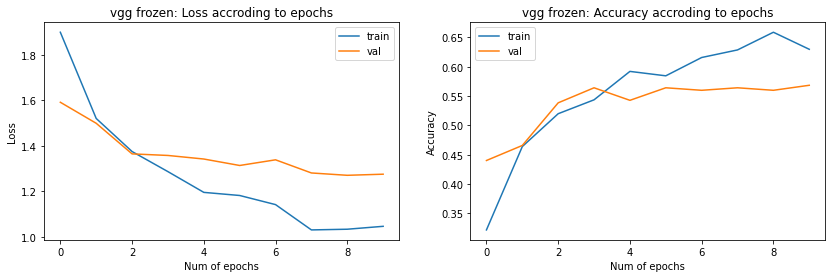

In [ ]:
plot_convergence(dict_res, num_epochs,'vgg frozen')

Results are much lower than before, when we trained all the parameters. This is because the model is probably too weak -  we are actually training only a multi-class linear classifier for 4096 features (Logistic regression) which may not comply for this kind of 'heavy' task. One possible way to improve results is to add more layers - on top of the last one or simply by un-freezing more layers (maybe all of the classifiers' layers). 

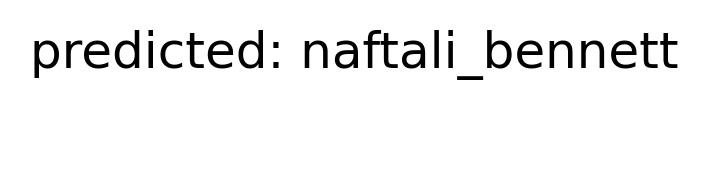

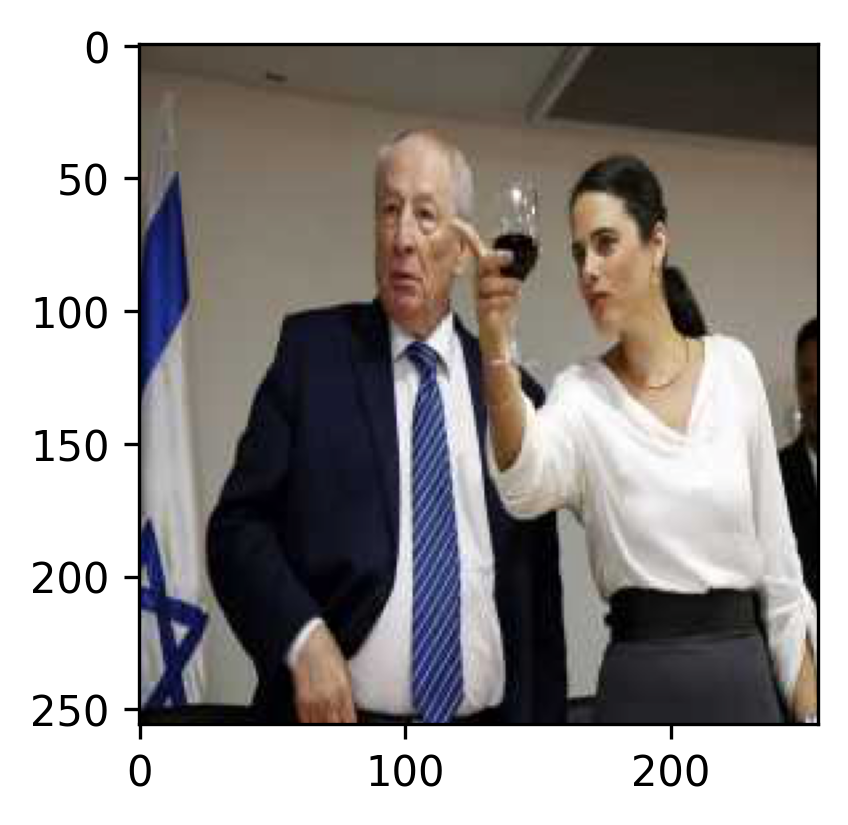

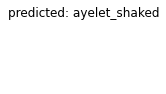

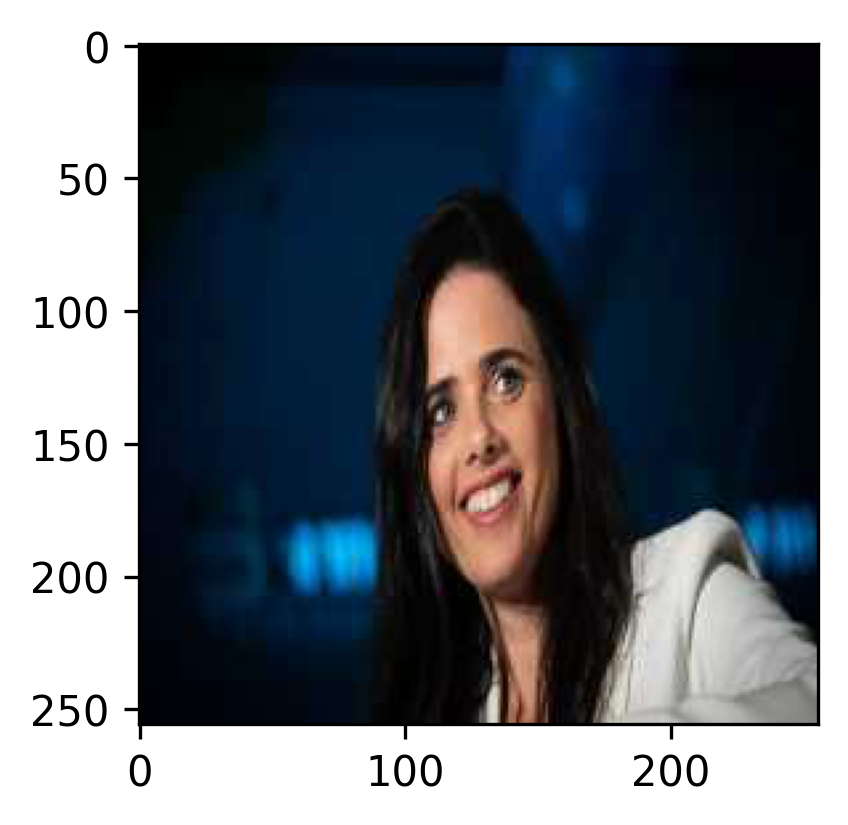

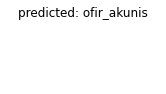

...

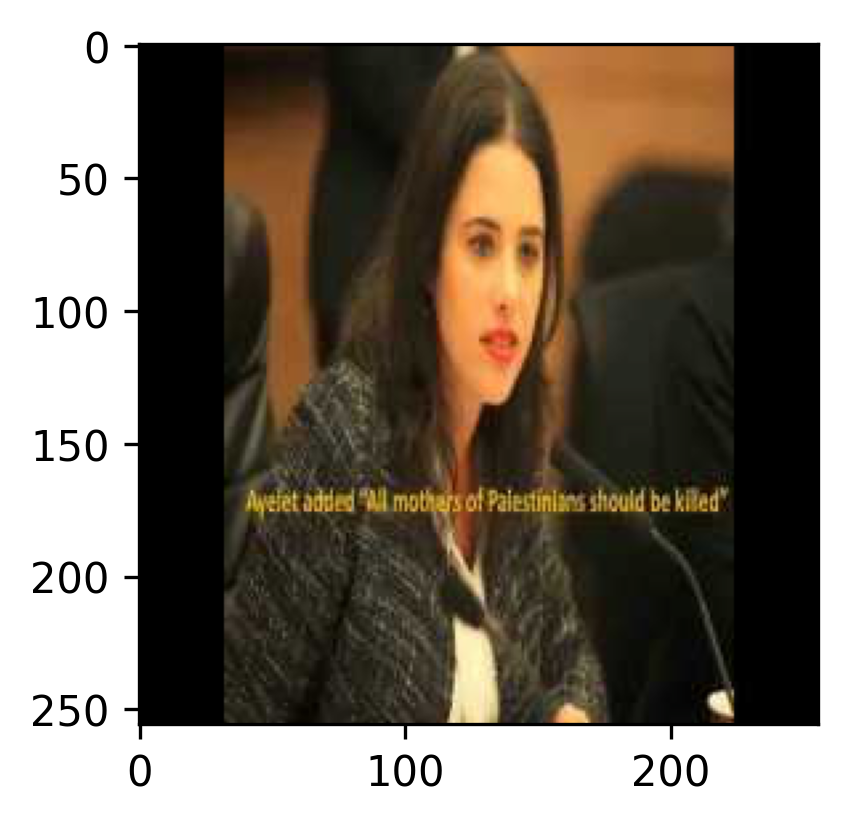

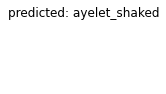

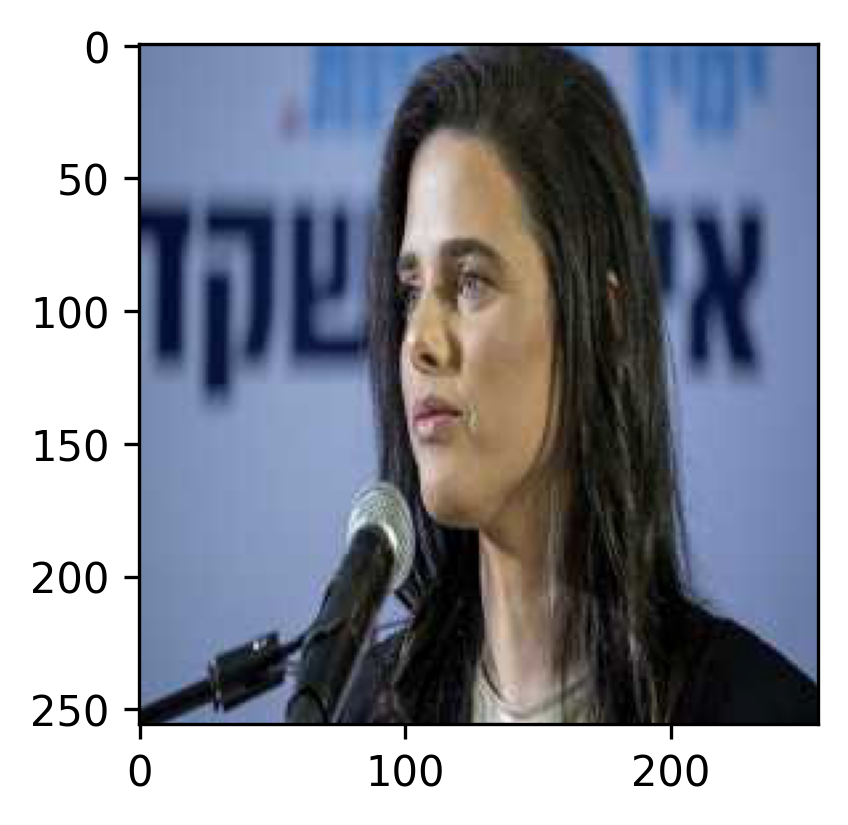

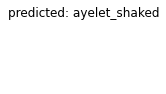

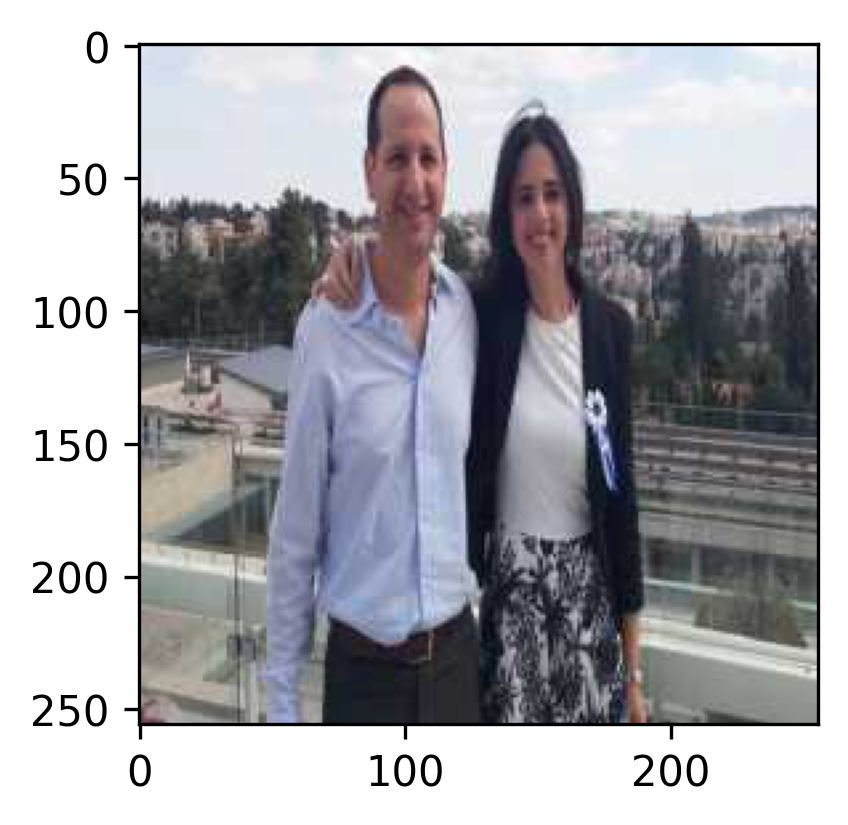

In [ ]:
visualize_model(frz_model)

plt.ioff()
plt.show()

## Task 5: Comparison with a model trained from scratch
In this section, compare the performance of the pretrained model with those of a model trained from scratch.  
Plot the train and validation loss and accuracy with time.

Note: To do this, you will need to modify `train_model()` to return the validation accuracy.

In [ ]:
def prepare_model(model,num_classes=9, LR=0.001, lin_layer='none'):
  num_ftrs=get_in_features(model)
   
 
  
  last_layer=nn.Linear(in_features=num_ftrs, out_features=num_classes)
  if lin_layer=='fc':
      model.fc=nn.Linear(in_features=num_ftrs, out_features=num_classes)
  if lin_layer=='classifier':
      model.classifier=nn.Linear(in_features=num_ftrs, out_features=num_classes)
  model.to(device)
  criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
  optimizer_ft = optim.SGD(model.parameters(), lr=LR, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
  exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
  return model, optimizer_ft,exp_lr_scheduler, criterion, last_layer

In [ ]:
model0 = models.vgg16(pretrained=False)
 
model0, optimizer_ft,exp_lr_scheduler, criterion, last_layer = prepare_model(model0, LR=0.001)
model0.classifier[6]=last_layer

model0.to(device) 
 
model0, dict_res = train_model(model0, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------

train Loss: 2.1012 Acc: 0.2400


 10%|█         | 1/10 [00:19<02:59, 19.92s/it]


val Loss: 2.0669 Acc: 0.2479
Epoch 1/9
----------

train Loss: 2.0882 Acc: 0.2400


 20%|██        | 2/10 [00:39<02:39, 19.94s/it]


val Loss: 2.0496 Acc: 0.2479
Epoch 2/9
----------

train Loss: 2.0638 Acc: 0.2540


 30%|███       | 3/10 [00:59<02:19, 19.97s/it]


val Loss: 2.0462 Acc: 0.2479
Epoch 3/9
----------

train Loss: 2.0567 Acc: 0.2583


 40%|████      | 4/10 [01:19<01:59, 19.99s/it]


val Loss: 2.0559 Acc: 0.2479
Epoch 4/9
----------

train Loss: 2.0539 Acc: 0.2519


 50%|█████     | 5/10 [01:40<01:40, 20.12s/it]


val Loss: 2.0480 Acc: 0.2479
Epoch 5/9
----------

train Loss: 2.0509 Acc: 0.2540


 60%|██████    | 6/10 [02:00<01:20, 20.15s/it]


val Loss: 2.0412 Acc: 0.2479
Epoch 6/9
----------

train Loss: 2.0348 Acc: 0.2540


 70%|███████   | 7/10 [02:20<01:00, 20.17s/it]


val Loss: 2.0394 Acc: 0.2479
Epoch 7/9
----------

train Loss: 2.0193 Acc: 0.2551


 80%|████████  | 8/10 [02:41<00:40, 20.21s/it]


val Loss: 2.0367 Acc: 0.2479
Epoch 8/9
----------

train Loss: 2.0116 Acc: 0.2583


 90%|█████████ | 9/10 [03:01<00:20, 20.30s/it]


val Loss: 2.0349 Acc: 0.2479
Epoch 9/9
----------

train Loss: 2.0128 Acc: 0.2562


100%|██████████| 10/10 [03:21<00:00, 20.20s/it]


val Loss: 2.0357 Acc: 0.2479
Training complete in 3m 22s
Best val Acc: 0.247863


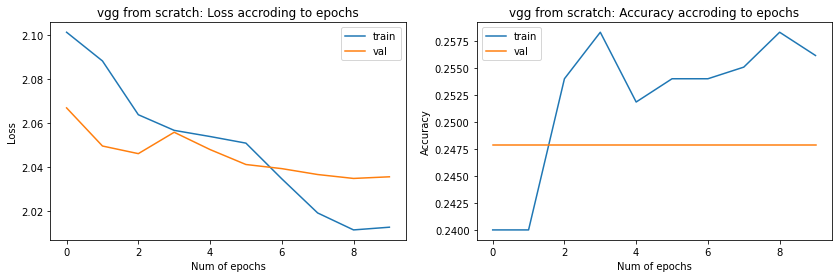

In [ ]:
plot_convergence(dict_res, num_epochs,'vgg from scratch')

Starting from scratch resulted in a very poor performence - only ~0.24% accuracy, Actually this is quite reasonable as we are training a deep and complicated architecture with relatively small amount of data (ImageNet contains milions of pictures!). Furthermore, differnt optimaztion scheme should be employed when training from scratch - as shown below training for more epochs and higher initial value for lr (0.01) made a siginificant change in results ~ 0.33 accuracy.  

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0/19
----------

train Loss: 2.1150 Acc: 0.2174


  5%|▌         | 1/20 [00:20<06:23, 20.21s/it]


val Loss: 2.0620 Acc: 0.2479
Epoch 1/19
----------

train Loss: 2.0587 Acc: 0.2519


 10%|█         | 2/20 [00:40<06:04, 20.23s/it]


val Loss: 2.0719 Acc: 0.2479
Epoch 2/19
----------

train Loss: 2.0524 Acc: 0.2573


 15%|█▌        | 3/20 [01:00<05:44, 20.25s/it]


val Loss: 2.0334 Acc: 0.2479
Epoch 3/19
----------

train Loss: 2.0295 Acc: 0.2497


 20%|██        | 4/20 [01:21<05:24, 20.28s/it]


val Loss: 2.0890 Acc: 0.2479
Epoch 4/19
----------

train Loss: 2.0654 Acc: 0.2497


 25%|██▌       | 5/20 [01:41<05:06, 20.46s/it]


val Loss: 2.0149 Acc: 0.3034
Epoch 5/19
----------

train Loss: 2.0131 Acc: 0.2487


 30%|███       | 6/20 [02:02<04:46, 20.45s/it]


val Loss: 1.9775 Acc: 0.2521
Epoch 6/19
----------

train Loss: 1.9715 Acc: 0.2583


 35%|███▌      | 7/20 [02:22<04:25, 20.43s/it]


val Loss: 2.0076 Acc: 0.2650
Epoch 7/19
----------

train Loss: 1.9553 Acc: 0.2820


 40%|████      | 8/20 [02:43<04:05, 20.49s/it]


val Loss: 1.9303 Acc: 0.2906
Epoch 8/19
----------

train Loss: 1.8897 Acc: 0.3025


 45%|████▌     | 9/20 [03:03<03:45, 20.47s/it]


val Loss: 1.9130 Acc: 0.3162
Epoch 9/19
----------

train Loss: 1.8775 Acc: 0.3165


 50%|█████     | 10/20 [03:24<03:24, 20.45s/it]


val Loss: 1.9144 Acc: 0.3162
Epoch 10/19
----------

train Loss: 1.8631 Acc: 0.3272


 55%|█████▌    | 11/20 [03:44<03:03, 20.42s/it]


val Loss: 1.9023 Acc: 0.3291
Epoch 11/19
----------

train Loss: 1.8259 Acc: 0.3391


 60%|██████    | 12/20 [04:04<02:43, 20.40s/it]


val Loss: 1.9070 Acc: 0.3205
Epoch 12/19
----------

train Loss: 1.8205 Acc: 0.3283


 65%|██████▌   | 13/20 [04:25<02:22, 20.41s/it]


val Loss: 1.8924 Acc: 0.3205
Epoch 13/19
----------

train Loss: 1.8013 Acc: 0.3574


 70%|███████   | 14/20 [04:45<02:02, 20.41s/it]


val Loss: 1.8822 Acc: 0.3248
Epoch 14/19
----------

train Loss: 1.7697 Acc: 0.3617


 75%|███████▌  | 15/20 [05:06<01:42, 20.42s/it]


val Loss: 1.8885 Acc: 0.3205
Epoch 15/19
----------

train Loss: 1.7628 Acc: 0.3778


 80%|████████  | 16/20 [05:26<01:21, 20.40s/it]


val Loss: 1.8934 Acc: 0.3291
Epoch 16/19
----------

train Loss: 1.7532 Acc: 0.3660


 85%|████████▌ | 17/20 [05:46<01:01, 20.38s/it]


val Loss: 1.8938 Acc: 0.3291
Epoch 17/19
----------

train Loss: 1.7551 Acc: 0.3617


 90%|█████████ | 18/20 [06:07<00:40, 20.42s/it]


val Loss: 1.8919 Acc: 0.3248
Epoch 18/19
----------

train Loss: 1.7734 Acc: 0.3531


 95%|█████████▌| 19/20 [06:28<00:20, 20.52s/it]


val Loss: 1.8904 Acc: 0.3248
Epoch 19/19
----------

train Loss: 1.7387 Acc: 0.3778


100%|██████████| 20/20 [06:48<00:00, 20.44s/it]


val Loss: 1.8886 Acc: 0.3291
Training complete in 6m 49s
Best val Acc: 0.329060


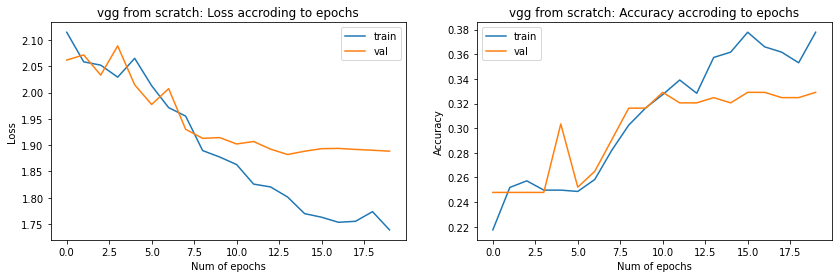

In [ ]:
model0 = models.vgg16(pretrained=False)
 
model0, optimizer_ft0,exp_lr_scheduler0, criterion, last_layer = prepare_model(model0, LR=0.01)
model0.classifier[6]=last_layer

model0.to(device) 

num_epochs0 = 20
model0, dict_res = train_model(model0, 
                    dataloaders,
                       criterion, 
                       optimizer_ft0, 
                       exp_lr_scheduler0,
                       num_epochs=num_epochs0)
plot_convergence(dict_res, num_epochs0,'vgg from scratch')

## Task 6: Data Augmentation
Manually labeling can be expensive, both in terms of money and of time. Data augmentations serve to increase the amount of data available for the classifier without requiring labeling more images.  

The torch vision package allows easy augmentation of images using the data transforms.  
Use and adapt the code below to try different augmentations, and discuss the results and the model improvements you got from these augmentations.

[This guide](https://www.analyticsvidhya.com/blog/2019/12/image-augmentation-deep-learning-pytorch/) might help you along the way.

We're going to experiment with augmenatations in 2 manners:
1. Extending the data by adding transformed pictures thus getting data of original_size * (number of transformations+1)
2. Keeping the same size as the original but extending its variability by applying the transformations randomly each time a picture is loaded from the data loader. Due to the randomness we want to make sure that our model will actually see all the different variations so we we'll train it for more epochs.

In [ ]:
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x]) for x in ['train', 'val']}
data_transforms_aug = {
    'flip crop': transforms.Compose([
        #transforms.Resize((256, 256)), 
        transforms.RandomHorizontalFlip(p=1),  
        transforms.CenterCrop(175),  
        transforms.Resize((256, 256)),   
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ]),
    'color': transforms.Compose([
        transforms.Resize((256, 256)), 
        transforms.ColorJitter(brightness=0.1, contrast=0.2, saturation=0.2, hue=0.2),      
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ]),
     'blur': transforms.Compose([
        transforms.Resize((256, 256)), 
        transforms.GaussianBlur(5),
       # transforms.FiveCrop(50),      
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ]),
    'cut out': transforms.Compose([
        transforms.Resize((256, 256)),            
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
        transforms.RandomErasing(p=1,scale=(0.02,0.2)),
    ]),
    'rotate shift': transforms.Compose([
        transforms.Resize((256, 256)), 
        #transforms.RandomRotation(50), 
        transforms.RandomAffine(20, translate=(0.2,0.2)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ]),
    
}

merged_data=image_datasets['train']
transformations=['flip crop','color','blur','cut out','rotate shift']
orig_size = len(image_datasets['train'])

# defining DataLoaders
 

In [ ]:
def extend_data(train_ds,transformations, data_transforms, augment=True):
  merged_data=train_ds
 
  for t in transformations:
    if not augment:
      augmented_data =datasets.ImageFolder(os.path.join(data_dir, 'train'),
                                            data_transforms)
    else:
      augmented_data =datasets.ImageFolder(os.path.join(data_dir, 'train'),
                                            data_transforms[t])
    # merging the original ImageFolder and the manipulated ImageFolder
    merged_data = torch.utils.data.ConcatDataset([merged_data, augmented_data])
  return merged_data 


In [ ]:
merged_data=extend_data(image_datasets['train'], transformations,data_transforms_aug)
dataloaders_aug = {
    'train': torch.utils.data.DataLoader(merged_data, batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
image_datasets['train']= merged_data
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

dataset_sizes:  {'train': 5574, 'val': 234}


Let's see some random examples from the transforamtions that we applied

transfomed images on the left, originals on the right


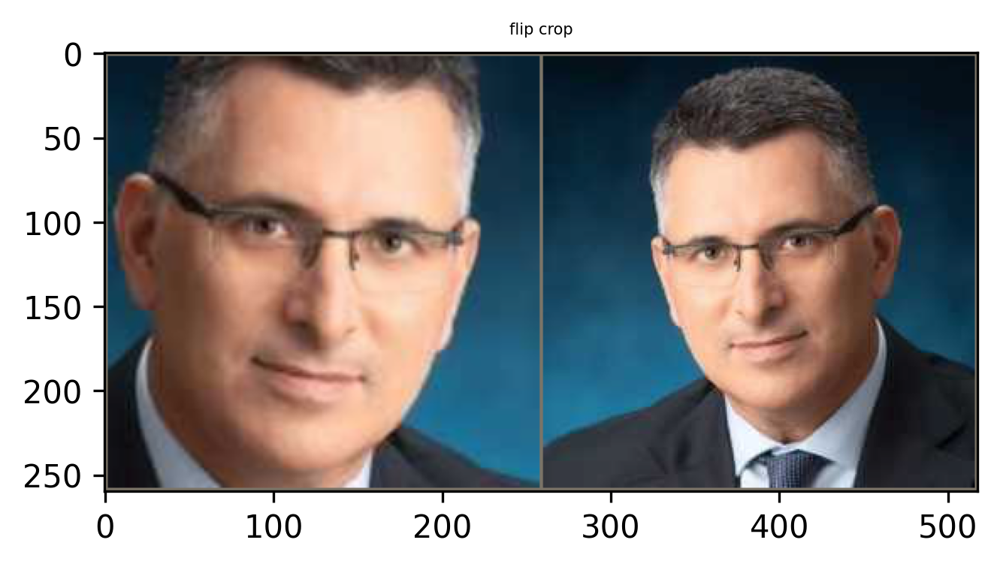

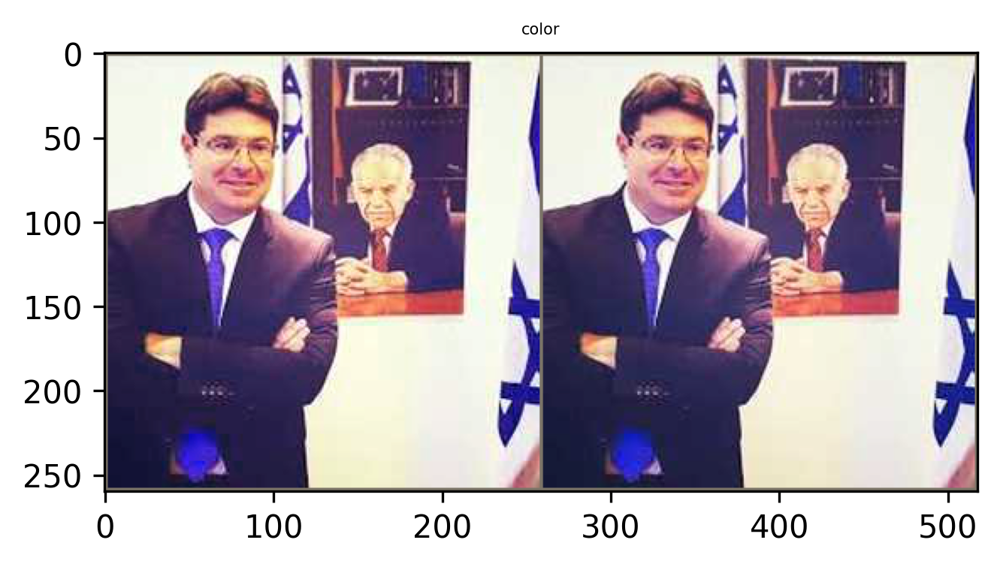

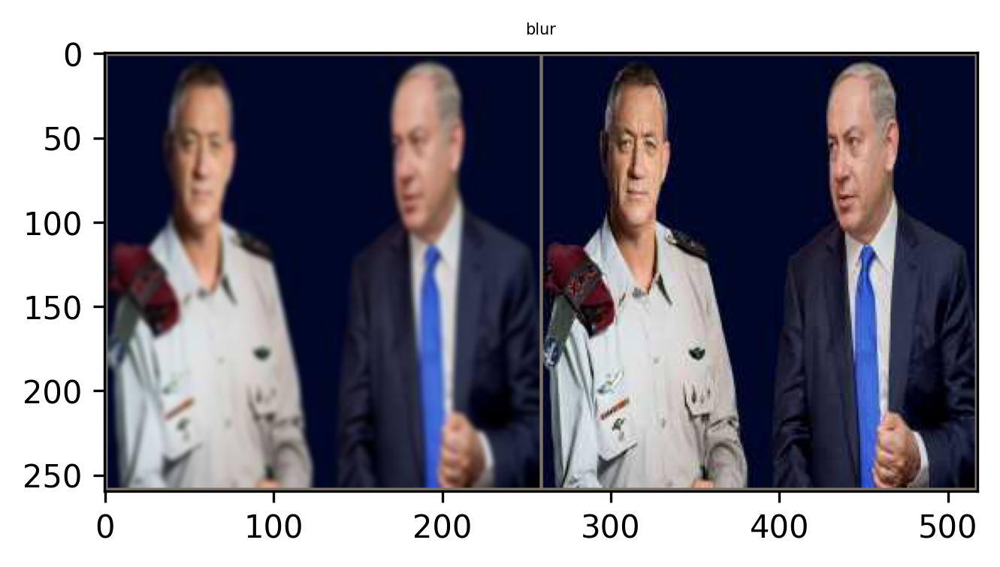

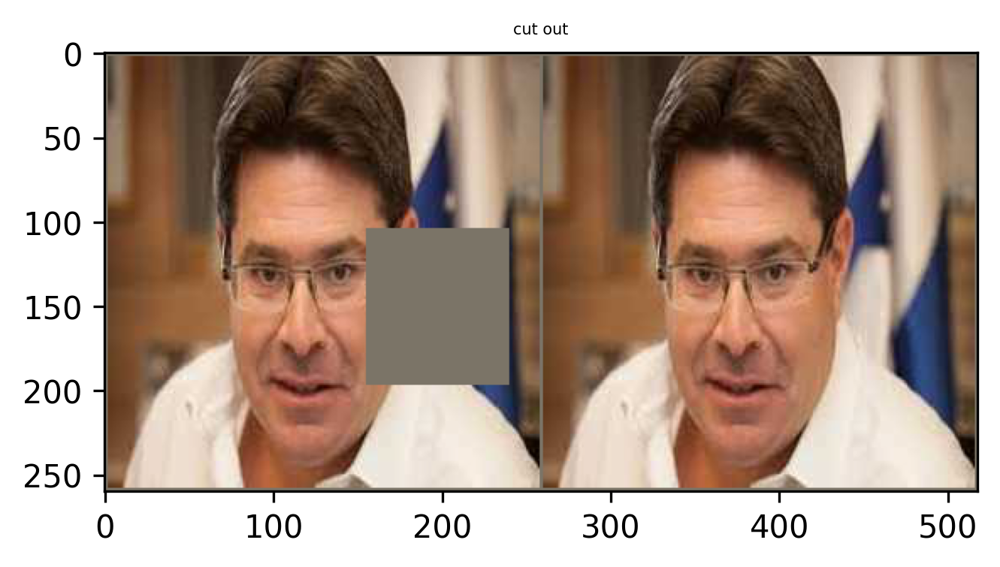

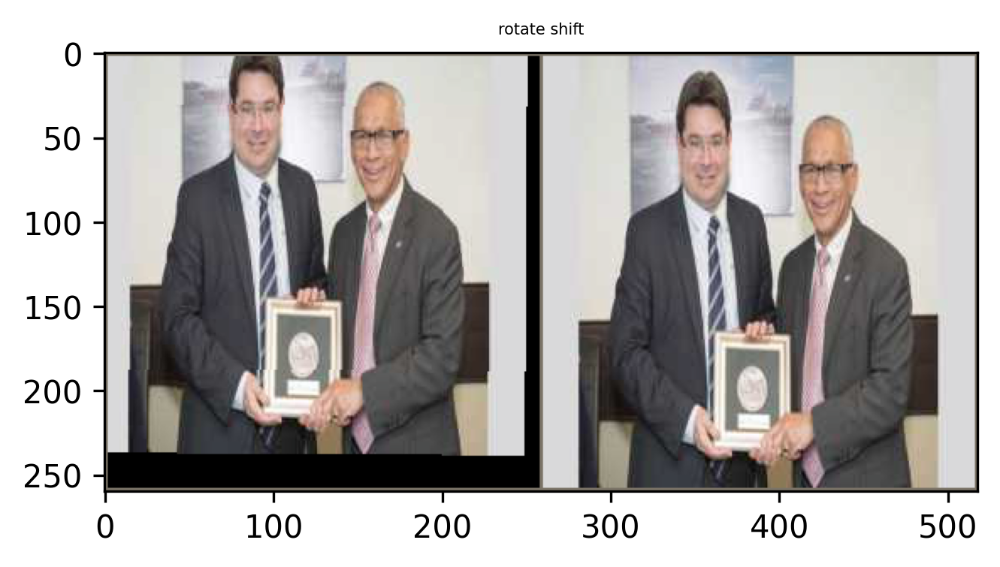

In [ ]:
#lst_images =[]
j=0
print('transfomed images on the left, originals on the right')
for i in range(orig_size,dataset_sizes['train'], orig_size):
  lst_images =[]
  ind=np.random.randint(i, i+orig_size)
  tensor_image=merged_data[ind][0]
  #lst_images.append(tensor_image) 
  lst_images=[tensor_image,merged_data[ind%orig_size][0]]
 
  imshow(torchvision.utils.make_grid(lst_images, nrow=2),title=transformations[j])
  j=j+1
#plt.imshow(  tensor_image.permute(1, 2, 0)  )
#imshow(torchvision.utils.make_grid(lst_images, nrow=2))

In [ ]:
frozen, optimizer_ft, exp_lr_scheduler= frozen_model()
frz_aug_model, dict_res = train_model(frozen, 
                    dataloaders_aug,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------

train Loss: 1.5730 Acc: 0.4361


 10%|█         | 1/10 [00:39<05:53, 39.22s/it]


val Loss: 1.3872 Acc: 0.5128
Epoch 1/9
----------

train Loss: 1.3251 Acc: 0.5370


 20%|██        | 2/10 [01:18<05:13, 39.16s/it]


val Loss: 1.3430 Acc: 0.5726
Epoch 2/9
----------

train Loss: 1.2226 Acc: 0.5764


 30%|███       | 3/10 [01:57<04:33, 39.12s/it]


val Loss: 1.2406 Acc: 0.5855
Epoch 3/9
----------

train Loss: 1.1927 Acc: 0.5820


 40%|████      | 4/10 [02:36<03:54, 39.12s/it]


val Loss: 1.2139 Acc: 0.5855
Epoch 4/9
----------

train Loss: 1.1222 Acc: 0.6118


 50%|█████     | 5/10 [03:15<03:15, 39.18s/it]


val Loss: 1.2563 Acc: 0.5812
Epoch 5/9
----------

train Loss: 1.1282 Acc: 0.6055


 60%|██████    | 6/10 [03:54<02:36, 39.19s/it]


val Loss: 1.1602 Acc: 0.6026
Epoch 6/9
----------

train Loss: 1.0826 Acc: 0.6180


 70%|███████   | 7/10 [04:34<01:57, 39.19s/it]


val Loss: 1.2041 Acc: 0.5769
Epoch 7/9
----------

train Loss: 1.0156 Acc: 0.6496


 80%|████████  | 8/10 [05:13<01:18, 39.13s/it]


val Loss: 1.1417 Acc: 0.6154
Epoch 8/9
----------

train Loss: 0.9902 Acc: 0.6521


 90%|█████████ | 9/10 [05:52<00:39, 39.12s/it]


val Loss: 1.1402 Acc: 0.6111
Epoch 9/9
----------

train Loss: 0.9898 Acc: 0.6591


100%|██████████| 10/10 [06:31<00:00, 39.12s/it]


val Loss: 1.1391 Acc: 0.6068
Training complete in 6m 31s
Best val Acc: 0.615385


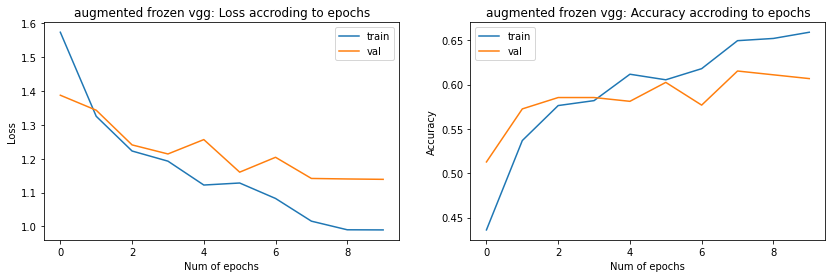

In [ ]:
plot_convergence(dict_res, num_epochs,'augmented frozen vgg')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0/9
----------

train Loss: 1.3337 Acc: 0.5235


 10%|█         | 1/10 [01:49<16:22, 109.19s/it]


val Loss: 0.9754 Acc: 0.6667
Epoch 1/9
----------

train Loss: 0.4574 Acc: 0.8518


 20%|██        | 2/10 [03:38<14:33, 109.19s/it]


val Loss: 0.7547 Acc: 0.8034
Epoch 2/9
----------

train Loss: 0.2074 Acc: 0.9316


 30%|███       | 3/10 [05:27<12:43, 109.13s/it]


val Loss: 0.6848 Acc: 0.8291
Epoch 3/9
----------

train Loss: 0.1254 Acc: 0.9602


 40%|████      | 4/10 [07:16<10:54, 109.12s/it]


val Loss: 0.8087 Acc: 0.8034
Epoch 4/9
----------

train Loss: 0.0971 Acc: 0.9706


 50%|█████     | 5/10 [09:05<09:05, 109.14s/it]


val Loss: 0.9520 Acc: 0.8120
Epoch 5/9
----------

train Loss: 0.0645 Acc: 0.9781


 60%|██████    | 6/10 [10:54<07:16, 109.12s/it]


val Loss: 1.0178 Acc: 0.8419
Epoch 6/9
----------

train Loss: 0.0627 Acc: 0.9803


 70%|███████   | 7/10 [12:43<05:27, 109.12s/it]


val Loss: 0.8750 Acc: 0.8333
Epoch 7/9
----------

train Loss: 0.0347 Acc: 0.9871


 80%|████████  | 8/10 [14:32<03:38, 109.13s/it]


val Loss: 0.8113 Acc: 0.8462
Epoch 8/9
----------

train Loss: 0.0221 Acc: 0.9925


 90%|█████████ | 9/10 [16:22<01:49, 109.16s/it]


val Loss: 0.8807 Acc: 0.8504
Epoch 9/9
----------

train Loss: 0.0187 Acc: 0.9939


100%|██████████| 10/10 [18:11<00:00, 109.11s/it]


val Loss: 0.8460 Acc: 0.8504
Training complete in 18m 11s
Best val Acc: 0.850427


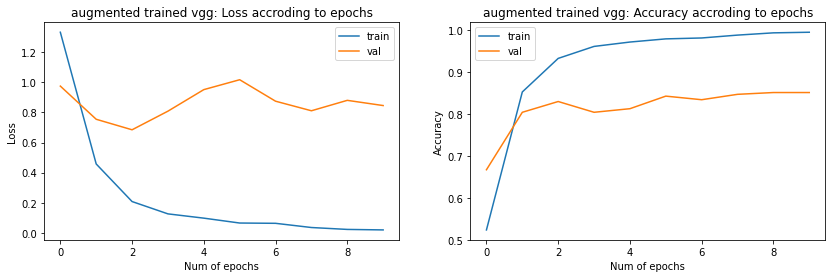

In [ ]:
raw_model = models.vgg16(pretrained=True)
 
model, optimizer_ft,exp_lr_scheduler, criterion, last_layer = prepare_model(raw_model, LR=0.001)
model.classifier[6]=last_layer
model.to(device) 
aug_vgg, dict_res = train_model(model, 
                    dataloaders_aug,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)
plot_convergence(dict_res, num_epochs,'augmented trained vgg')

Augmenting the data by replicating and transforming pictures  increased performence a bit for the frozen and pretrained model and quite significantly for the model from scratch. Naturally, training time increased as data size is bigger. Overfitting remained for the pretrained model as it was able to learn the transormed data well, maybe too well.

In [ ]:
data_transforms_aug_list = [
        transforms.RandomHorizontalFlip(p=1),
        transforms.ColorJitter(brightness=0.1, contrast=0.2, saturation=0.2, hue=0.2),
        transforms.GaussianBlur(5),      
        transforms.RandomAffine(20, translate=(0.2,0.2))]
aug_transforms = transforms.Compose([
          transforms.Resize((256, 256)),
          #some of the pictures will be randomly tranformed to mix thing up
          transforms.RandomApply(data_transforms_aug_list, p=0.2),
          transforms.RandomApply([transforms.CenterCrop(175), transforms.Resize((256, 256))], p=0.2),
          transforms.ToTensor(),
          transforms.Normalize(means, stds),
          transforms.RandomApply([transforms.RandomErasing(p=1,scale=(0.02,0.2))], p=0.2),
      ])
training_dataset_aug = datasets.ImageFolder(os.path.join(data_dir, 'train'),
                                            aug_transforms)
 
dataloaders_aug = {
    'train': torch.utils.data.DataLoader(merged_data, batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }  
dataloaders_aug2 = {
    'train': torch.utils.data.DataLoader(training_dataset_aug, batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
dataset_sizes['train'] = orig_size
num_epochs2=20

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0/19
----------

train Loss: 1.9861 Acc: 0.2713


  5%|▌         | 1/20 [00:08<02:47,  8.84s/it]


val Loss: 1.7060 Acc: 0.3974
Epoch 1/19
----------

train Loss: 1.6609 Acc: 0.4144


 10%|█         | 2/20 [00:17<02:38,  8.80s/it]


val Loss: 1.4913 Acc: 0.4957
Epoch 2/19
----------

train Loss: 1.6314 Acc: 0.4058


 15%|█▌        | 3/20 [00:26<02:29,  8.80s/it]


val Loss: 1.4459 Acc: 0.4957
Epoch 3/19
----------

train Loss: 1.5475 Acc: 0.4392


 20%|██        | 4/20 [00:35<02:21,  8.87s/it]


val Loss: 1.4401 Acc: 0.4915
Epoch 4/19
----------

train Loss: 1.4839 Acc: 0.4779


 25%|██▌       | 5/20 [00:44<02:12,  8.87s/it]


val Loss: 1.3637 Acc: 0.5256
Epoch 5/19
----------

train Loss: 1.4441 Acc: 0.4865


 30%|███       | 6/20 [00:53<02:03,  8.83s/it]


val Loss: 1.3505 Acc: 0.5598
Epoch 6/19
----------

train Loss: 1.3823 Acc: 0.5307


 35%|███▌      | 7/20 [01:01<01:54,  8.81s/it]


val Loss: 1.3616 Acc: 0.5299
Epoch 7/19
----------

train Loss: 1.2836 Acc: 0.5447


 40%|████      | 8/20 [01:10<01:45,  8.76s/it]


val Loss: 1.3144 Acc: 0.5427
Epoch 8/19
----------

train Loss: 1.3201 Acc: 0.5328


 45%|████▌     | 9/20 [01:19<01:37,  8.82s/it]


val Loss: 1.3102 Acc: 0.5641
Epoch 9/19
----------

train Loss: 1.3134 Acc: 0.5371


 50%|█████     | 10/20 [01:27<01:27,  8.75s/it]


val Loss: 1.3002 Acc: 0.5470
Epoch 10/19
----------

train Loss: 1.2318 Acc: 0.5576


 55%|█████▌    | 11/20 [01:36<01:18,  8.77s/it]


val Loss: 1.2917 Acc: 0.5598
Epoch 11/19
----------

train Loss: 1.3180 Acc: 0.5565


 60%|██████    | 12/20 [01:45<01:10,  8.80s/it]


val Loss: 1.2947 Acc: 0.5427
Epoch 12/19
----------

train Loss: 1.2511 Acc: 0.5759


 65%|██████▌   | 13/20 [01:54<01:01,  8.78s/it]


val Loss: 1.2947 Acc: 0.5513
Epoch 13/19
----------

train Loss: 1.2972 Acc: 0.5662


 70%|███████   | 14/20 [02:03<00:52,  8.82s/it]


val Loss: 1.2926 Acc: 0.5470
Epoch 14/19
----------

train Loss: 1.2727 Acc: 0.5694


 75%|███████▌  | 15/20 [02:12<00:44,  8.84s/it]


val Loss: 1.2918 Acc: 0.5470
Epoch 15/19
----------

train Loss: 1.3060 Acc: 0.5576


 80%|████████  | 16/20 [02:21<00:35,  8.90s/it]


val Loss: 1.2925 Acc: 0.5556
Epoch 16/19
----------

train Loss: 1.2541 Acc: 0.5544


 85%|████████▌ | 17/20 [02:30<00:26,  8.87s/it]


val Loss: 1.2920 Acc: 0.5470
Epoch 17/19
----------

train Loss: 1.2485 Acc: 0.5737


 90%|█████████ | 18/20 [02:39<00:17,  8.91s/it]


val Loss: 1.2915 Acc: 0.5470
Epoch 18/19
----------

train Loss: 1.2407 Acc: 0.5759


 95%|█████████▌| 19/20 [02:47<00:08,  8.91s/it]


val Loss: 1.2917 Acc: 0.5470
Epoch 19/19
----------

train Loss: 1.2680 Acc: 0.5651


100%|██████████| 20/20 [02:56<00:00,  8.83s/it]


val Loss: 1.2918 Acc: 0.5470
Training complete in 2m 57s
Best val Acc: 0.564103


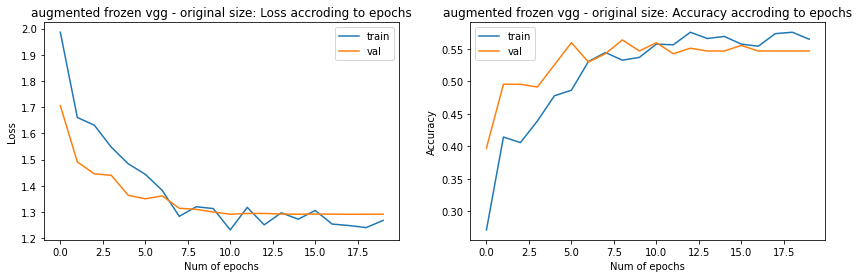

In [ ]:
frozen, optimizer_ft, exp_lr_scheduler= frozen_model()
frz_aug_model, dict_res = train_model(frozen, 
                    dataloaders_aug2,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs2)
plot_convergence(dict_res, num_epochs2,'augmented frozen vgg - original size')

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0/19
----------

train Loss: 2.1138 Acc: 0.2078


  5%|▌         | 1/20 [00:20<06:24, 20.22s/it]


val Loss: 1.8995 Acc: 0.3162
Epoch 1/19
----------

train Loss: 1.8036 Acc: 0.3638


 10%|█         | 2/20 [00:41<06:07, 20.40s/it]


val Loss: 1.5292 Acc: 0.4744
Epoch 2/19
----------

train Loss: 1.5456 Acc: 0.4521


 15%|█▌        | 3/20 [01:01<05:46, 20.39s/it]


val Loss: 1.3876 Acc: 0.5085
Epoch 3/19
----------

train Loss: 1.2969 Acc: 0.5382


 20%|██        | 4/20 [01:22<05:27, 20.49s/it]


val Loss: 1.2285 Acc: 0.5684
Epoch 4/19
----------

train Loss: 1.0940 Acc: 0.6179


 25%|██▌       | 5/20 [01:42<05:06, 20.40s/it]


val Loss: 1.2580 Acc: 0.6154
Epoch 5/19
----------

train Loss: 0.8684 Acc: 0.7169


 30%|███       | 6/20 [02:02<04:45, 20.40s/it]


val Loss: 0.8653 Acc: 0.7179
Epoch 6/19
----------

train Loss: 0.7144 Acc: 0.7718


 35%|███▌      | 7/20 [02:23<04:25, 20.39s/it]


val Loss: 0.8804 Acc: 0.6709
Epoch 7/19
----------

train Loss: 0.5642 Acc: 0.8052


 40%|████      | 8/20 [02:43<04:04, 20.34s/it]


val Loss: 0.7069 Acc: 0.7821
Epoch 8/19
----------

train Loss: 0.4760 Acc: 0.8504


 45%|████▌     | 9/20 [03:03<03:43, 20.29s/it]


val Loss: 0.6911 Acc: 0.7778
Epoch 9/19
----------

train Loss: 0.4185 Acc: 0.8644


 50%|█████     | 10/20 [03:23<03:22, 20.25s/it]


val Loss: 0.6883 Acc: 0.7949
Epoch 10/19
----------

train Loss: 0.4009 Acc: 0.8762


 55%|█████▌    | 11/20 [03:43<03:02, 20.25s/it]


val Loss: 0.6733 Acc: 0.8034
Epoch 11/19
----------

train Loss: 0.4339 Acc: 0.8482


 60%|██████    | 12/20 [04:04<02:41, 20.23s/it]


val Loss: 0.6594 Acc: 0.8120
Epoch 12/19
----------

train Loss: 0.3910 Acc: 0.8794


 65%|██████▌   | 13/20 [04:24<02:22, 20.29s/it]


val Loss: 0.6551 Acc: 0.8034
Epoch 13/19
----------

train Loss: 0.4008 Acc: 0.8665


 70%|███████   | 14/20 [04:44<02:01, 20.26s/it]


val Loss: 0.6740 Acc: 0.7991
Epoch 14/19
----------

train Loss: 0.3458 Acc: 0.8794


 75%|███████▌  | 15/20 [05:04<01:41, 20.24s/it]


val Loss: 0.6620 Acc: 0.8077
Epoch 15/19
----------

train Loss: 0.3355 Acc: 0.8848


 80%|████████  | 16/20 [05:25<01:21, 20.27s/it]


val Loss: 0.6494 Acc: 0.8205
Epoch 16/19
----------

train Loss: 0.3319 Acc: 0.8945


 85%|████████▌ | 17/20 [05:45<01:00, 20.26s/it]


val Loss: 0.6423 Acc: 0.8205
Epoch 17/19
----------

train Loss: 0.3328 Acc: 0.8827


 90%|█████████ | 18/20 [06:05<00:40, 20.30s/it]


val Loss: 0.6373 Acc: 0.8162
Epoch 18/19
----------

train Loss: 0.3288 Acc: 0.8956


 95%|█████████▌| 19/20 [06:26<00:20, 20.31s/it]


val Loss: 0.6439 Acc: 0.8205
Epoch 19/19
----------

train Loss: 0.3612 Acc: 0.8816


100%|██████████| 20/20 [06:46<00:00, 20.33s/it]


val Loss: 0.6535 Acc: 0.8120
Training complete in 6m 47s
Best val Acc: 0.820513


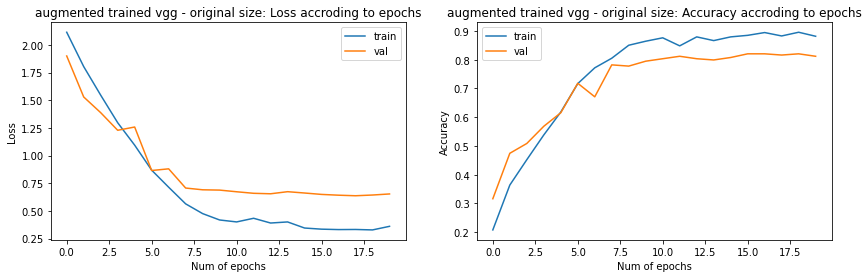

In [ ]:
num_epochs2=20
raw_model = models.vgg16(pretrained=True)
 
model, optimizer_ft,exp_lr_scheduler, criterion, last_layer = prepare_model(raw_model, LR=0.001)
model.classifier[6]=last_layer
model.to(device) 

aug_vgg, dict_res = train_model(model, 
                    dataloaders_aug2,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs2)
plot_convergence(dict_res, num_epochs2,'augmented trained vgg - original size')

Using the second method of keeping of randomly applying transformations 'on the fly' without extending the data we got no improvements in accuracy but on the other hand overfitting was largely reduced due to decreasing of train score. 
The improvement in overfitting didn't translate to better generalization and better validation score but as there is still room for improvement in training, it might be that better training scheme may improve validation accuracy as well.(Althogh in the plots we see that we reached a plateau already)
Anyway, running time was significantly shorter from the first method (6 min. vs. 18 for the pretrained model).
 

## Task 7: Model Architectures
In the course we'll cover in depth various DL architectures suggested to perform image classification. Among other things, these networks differ in depth (the number of layers), the number of weights (the network power), the composing layers, and more.  
In the figure below, you can see the performance of different network architectures on the ImageNet Image Classification task, and the number of flops (atomic computations) required for them. 

![CNN performance/flops graph](https://miro.medium.com/max/1838/1*n16lj3lSkz2miMc_5cvkrA.jpeg)

In our code above we've used the `mobilenet` architecture.  
See if you can increase model performance by using alternative architectures from [torchvision.models](https://pytorch.org/vision/0.8/models.html).  
Pay attention to the input dimensions that each network architecture expects.

In [ ]:
 
 

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x]) for x in ['train', 'val']}
print(type(image_datasets['train']), len(image_datasets['train']))
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

class_names = image_datasets['train'].classes
print('class_names:', class_names)

In [ ]:
num_epochs=10
dense_model = models.densenet201(pretrained=True)
nxt_model= models.resnext101_32x8d(pretrained=True)
#res_model=models.resnet50(pretrained=True)
mobil_model=models.mobilenet_v2(pretrained=True)
models_data = [(dense_model, 'classifier'), (nxt_model,'fc'),(mobil_model,'fc')]
#models2check=[dense_model, nxt_model,mobil_model]
 
for model_data in models_data:#2check:
  print()
  model,optimizer_ft,exp_lr_scheduler, criterion, last_layer=prepare_model(model_data[0], lin_layer=model_data[1])
  print('Model '+ model.__class__.__name__+ " is training")
  #list(model.children())[-1] = last_layer
  
  model.to(device)
  model, dict_res = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=10, verbose=False)
  plot_convergence(dict_res,num_epochs,model.__class__.__name__)

The 3 models show quite similar results and performence is inversly related to training time.

## Task 8: Design your own Neural Network Architecture
Take a stab at building your own NN architecture.  
To allow you to experiment quickly, we'll limit it to 8 layers max, and up to 10 million parameters. Use [this PyTorch guide](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html) for reference.  
Train it only on our provided images - we'll present the winner with the best results on the validation set!

In [ ]:
import torch.nn.functional as F

class Net(nn.Module):

    def __init__(self, conv7=False, fc2=False):
        super(Net, self).__init__()
        # 1 input image channel, 6 output channels, 3x3 square convolution
        # kernel
        self.use_conv7=conv7
        self.use_fc2=fc2
        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv3 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv4 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv5 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) #128 128'
        self.conv6 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) #256'
        if self.use_conv7:
          self.conv7 = nn.Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)) #256'
          self.fc1 = nn.Linear(512*8*8,9)#128 *
        else:
          self.fc1 = nn.Linear(256*16*16,9)#512*8*8,9#128 *
        if self.use_fc2:
            self.fc1 = nn.Linear(256*16*16,128)
            self.fc2 = nn.Linear(128, 9)
        # an affine operation: y = Wx + b
        #self.fc1 = nn.Linear(256*16*16,9)#512*8*8,9#128 * 32*32, 9)  # 
        #
        #self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        # Max pooling over a (2, 2) window
        x = F.relu(self.conv1(x))#, (2, 2))
        # If the size is a square you can only specify a single number
        x = F.max_pool2d(F.relu(self.conv2(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = F.relu(self.conv3(x))
        x = F.max_pool2d(F.relu(self.conv4(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = F.max_pool2d(F.relu(self.conv5(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = F.max_pool2d(F.relu(self.conv6(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        if self.use_conv7:
          x = F.max_pool2d(F.relu(self.conv7(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = x.view(-1, self.num_flat_features(x))
        # if self.use_dropout:
        #   x = self.dropout(x)
        if self.use_fc2:
          x = F.relu(self.fc1(x))
          x = self.fc2(x)
        else:
           x = self.fc1(x)
       # x = F.relu(self.fc2(x))
        
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]  # all dimensions except the batch dimension
        num_features = 1
        for s in size:
            num_features *= s
        return num_features


model = Net()
 
print(model)
summary(model.to(device), (3, 256, 256))

Net(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=65536, out_features=9, bias=True)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
            Conv2d-2         [-1, 64, 256, 256]          36,928
            Conv2d-3        [-1, 128, 128, 128]          73,856
            Conv2d-4        [-1, 128, 128, 128]         147,584
            Conv2d-5          [-1, 256, 64, 64]         295,168
            Co

In [ ]:
#model = Net() 
model.to(device)
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
optimizer_ft = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
num_epochs=20

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0/19
----------

train Loss: 2.1082 Acc: 0.2422


  5%|▌         | 1/20 [00:22<07:02, 22.26s/it]


val Loss: 2.0619 Acc: 0.2479
Epoch 1/19
----------

train Loss: 2.0803 Acc: 0.2551


 10%|█         | 2/20 [00:44<06:41, 22.28s/it]


val Loss: 2.0466 Acc: 0.2479
Epoch 2/19
----------

train Loss: 2.0518 Acc: 0.2637


 15%|█▌        | 3/20 [01:06<06:18, 22.25s/it]


val Loss: 2.0143 Acc: 0.2607
Epoch 3/19
----------

train Loss: 1.9881 Acc: 0.2799


 20%|██        | 4/20 [01:29<05:57, 22.33s/it]


val Loss: 2.0565 Acc: 0.2436
Epoch 4/19
----------

train Loss: 1.9328 Acc: 0.3122


 25%|██▌       | 5/20 [01:51<05:35, 22.35s/it]


val Loss: 2.0375 Acc: 0.2436
Epoch 5/19
----------

train Loss: 1.8584 Acc: 0.3466


 30%|███       | 6/20 [02:14<05:14, 22.44s/it]


val Loss: 1.9280 Acc: 0.2863
Epoch 6/19
----------

train Loss: 1.7231 Acc: 0.4058


 35%|███▌      | 7/20 [02:36<04:51, 22.45s/it]


val Loss: 1.9522 Acc: 0.2949
Epoch 7/19
----------

train Loss: 1.4756 Acc: 0.4844


 40%|████      | 8/20 [02:59<04:29, 22.45s/it]


val Loss: 2.0030 Acc: 0.3077
Epoch 8/19
----------

train Loss: 1.1669 Acc: 0.6125


 45%|████▌     | 9/20 [03:21<04:06, 22.40s/it]


val Loss: 2.1775 Acc: 0.3632
Epoch 9/19
----------

train Loss: 0.9893 Acc: 0.6964


 50%|█████     | 10/20 [03:43<03:43, 22.33s/it]


val Loss: 2.1411 Acc: 0.3974
Epoch 10/19
----------

train Loss: 0.7796 Acc: 0.7643


 55%|█████▌    | 11/20 [04:06<03:22, 22.55s/it]


val Loss: 2.3320 Acc: 0.3932
Epoch 11/19
----------

train Loss: 0.5163 Acc: 0.8299


 60%|██████    | 12/20 [04:29<03:00, 22.62s/it]


val Loss: 2.6815 Acc: 0.4188
Epoch 12/19
----------

train Loss: 0.4239 Acc: 0.8730


 65%|██████▌   | 13/20 [04:52<02:38, 22.61s/it]


val Loss: 3.1086 Acc: 0.4786
Epoch 13/19
----------

train Loss: 0.1597 Acc: 0.9559


 70%|███████   | 14/20 [05:14<02:15, 22.53s/it]


val Loss: 3.8369 Acc: 0.4701
Epoch 14/19
----------

train Loss: 0.0761 Acc: 0.9849


 75%|███████▌  | 15/20 [05:36<01:52, 22.44s/it]


val Loss: 3.7810 Acc: 0.4701
Epoch 15/19
----------

train Loss: 0.0520 Acc: 0.9914


 80%|████████  | 16/20 [05:59<01:29, 22.42s/it]


val Loss: 3.8197 Acc: 0.4701
Epoch 16/19
----------

train Loss: 0.0418 Acc: 0.9925


 85%|████████▌ | 17/20 [06:21<01:07, 22.46s/it]


val Loss: 3.8969 Acc: 0.4701
Epoch 17/19
----------

train Loss: 0.0347 Acc: 0.9914


 90%|█████████ | 18/20 [06:44<00:45, 22.54s/it]


val Loss: 3.9699 Acc: 0.4658
Epoch 18/19
----------

train Loss: 0.0284 Acc: 0.9946


 95%|█████████▌| 19/20 [07:06<00:22, 22.52s/it]


val Loss: 4.0521 Acc: 0.4701
Epoch 19/19
----------

train Loss: 0.0268 Acc: 0.9925


100%|██████████| 20/20 [07:29<00:00, 22.47s/it]


val Loss: 4.1221 Acc: 0.4658
Training complete in 7m 29s
Best val Acc: 0.478632


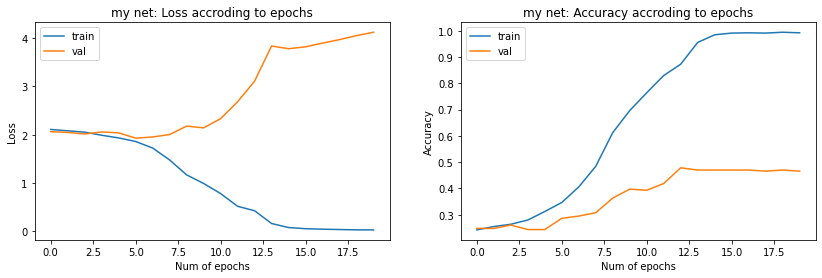

In [ ]:
model, dict_res = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)
plot_convergence(dict_res,num_epochs,'my net')

We got almost 0.5 accuracy on the valdiation set - not so good but actually not so bad also if we compare it to the results we got from vgg model when it was trained from scrach. We can see one problem though - high overfitting.  
Let's try adding one more fully connected layer

In [ ]:
model = Net(fc2=True) 
print(model)
summary(model.to(device), (3, 256, 256))

Net(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=65536, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=9, bias=True)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
            Conv2d-2         [-1, 64, 256, 256]          36,928
            Conv2d-3        [-1, 128, 128, 128]          73,856
            Conv2d-4        [-1, 128, 128, 128]         147,584
            Conv

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0/19
----------

train Loss: 2.0996 Acc: 0.2443


  5%|▌         | 1/20 [00:22<07:10, 22.67s/it]


val Loss: 2.3395 Acc: 0.2479
Epoch 1/19
----------

train Loss: 2.0922 Acc: 0.2551


 10%|█         | 2/20 [00:45<06:49, 22.76s/it]


val Loss: 2.0622 Acc: 0.2479
Epoch 2/19
----------

train Loss: 2.0684 Acc: 0.2551


 15%|█▌        | 3/20 [01:08<06:26, 22.74s/it]


val Loss: 2.0581 Acc: 0.2479
Epoch 3/19
----------

train Loss: 2.0554 Acc: 0.2551


 20%|██        | 4/20 [01:30<06:03, 22.71s/it]


val Loss: 2.0494 Acc: 0.2479
Epoch 4/19
----------

train Loss: 2.0511 Acc: 0.2551


 25%|██▌       | 5/20 [01:53<05:40, 22.68s/it]


val Loss: 2.1165 Acc: 0.2479
Epoch 5/19
----------

train Loss: 2.0160 Acc: 0.2487


 30%|███       | 6/20 [02:16<05:17, 22.69s/it]


val Loss: 2.0577 Acc: 0.2436
Epoch 6/19
----------

train Loss: 1.9766 Acc: 0.2766


 35%|███▌      | 7/20 [02:38<04:54, 22.66s/it]


val Loss: 1.9921 Acc: 0.2821
Epoch 7/19
----------

train Loss: 1.8774 Acc: 0.3100


 40%|████      | 8/20 [03:01<04:32, 22.69s/it]


val Loss: 1.9298 Acc: 0.2778
Epoch 8/19
----------

train Loss: 1.8219 Acc: 0.3305


 45%|████▌     | 9/20 [03:24<04:09, 22.67s/it]


val Loss: 1.9107 Acc: 0.2692
Epoch 9/19
----------

train Loss: 1.8061 Acc: 0.3498


 50%|█████     | 10/20 [03:47<03:47, 22.73s/it]


val Loss: 1.9260 Acc: 0.3077
Epoch 10/19
----------

train Loss: 1.7549 Acc: 0.3681


 55%|█████▌    | 11/20 [04:09<03:24, 22.70s/it]


val Loss: 1.8991 Acc: 0.2821
Epoch 11/19
----------

train Loss: 1.7304 Acc: 0.3918


 60%|██████    | 12/20 [04:32<03:01, 22.69s/it]


val Loss: 1.9226 Acc: 0.2778
Epoch 12/19
----------

train Loss: 1.7142 Acc: 0.3907


 65%|██████▌   | 13/20 [04:55<02:38, 22.70s/it]


val Loss: 1.9593 Acc: 0.2692
Epoch 13/19
----------

train Loss: 1.6449 Acc: 0.4144


 70%|███████   | 14/20 [05:17<02:16, 22.68s/it]


val Loss: 1.9222 Acc: 0.2650
Epoch 14/19
----------

train Loss: 1.4899 Acc: 0.4790


 75%|███████▌  | 15/20 [05:40<01:53, 22.68s/it]


val Loss: 1.9314 Acc: 0.2821
Epoch 15/19
----------

train Loss: 1.4461 Acc: 0.5027


 80%|████████  | 16/20 [06:03<01:30, 22.65s/it]


val Loss: 1.9398 Acc: 0.2735
Epoch 16/19
----------

train Loss: 1.4187 Acc: 0.5038


 85%|████████▌ | 17/20 [06:25<01:07, 22.65s/it]


val Loss: 1.9497 Acc: 0.2863
Epoch 17/19
----------

train Loss: 1.3905 Acc: 0.5242


 90%|█████████ | 18/20 [06:48<00:45, 22.70s/it]


val Loss: 1.9610 Acc: 0.2906
Epoch 18/19
----------

train Loss: 1.3648 Acc: 0.5361


 95%|█████████▌| 19/20 [07:11<00:22, 22.68s/it]


val Loss: 1.9880 Acc: 0.3034
Epoch 19/19
----------

train Loss: 1.3347 Acc: 0.5608


100%|██████████| 20/20 [07:34<00:00, 22.71s/it]


val Loss: 1.9948 Acc: 0.3120
Training complete in 7m 34s
Best val Acc: 0.311966


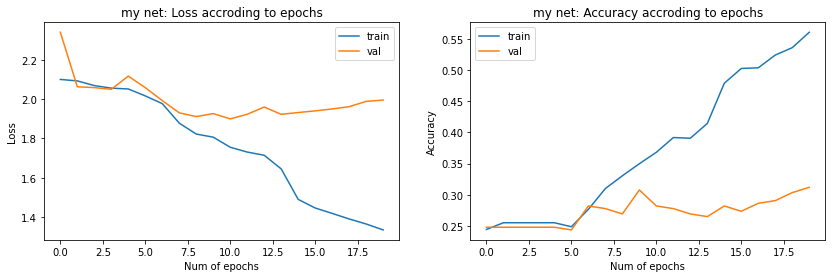

In [ ]:

model.to(device)
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
optimizer_ft = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
num_epochs=20
model, dict_res = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)
plot_convergence(dict_res,num_epochs,'my net')

Adding the fc layer really added a lot of parameters but didn't help improving the score.
Let's try to add another convolutional layer instead

In [ ]:
model = Net(conv7=True) 
print(model)
summary(model.to(device), (3, 256, 256))

Net(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv7): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=32768, out_features=9, bias=True)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
            Conv2d-2         [-1, 64, 256, 256]          36,928
            Conv2d-3        [-1, 128, 128, 128]          73,856
            Conv2d-4        [-1, 128, 128, 128]         147,584

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 0/19
----------

train Loss: 2.1049 Acc: 0.2508


  5%|▌         | 1/20 [00:23<07:22, 23.31s/it]


val Loss: 2.0586 Acc: 0.2479
Epoch 1/19
----------

train Loss: 2.0717 Acc: 0.2551


 10%|█         | 2/20 [00:46<06:59, 23.29s/it]


val Loss: 2.0599 Acc: 0.2479
Epoch 2/19
----------

train Loss: 2.0626 Acc: 0.2551


 15%|█▌        | 3/20 [01:09<06:35, 23.29s/it]


val Loss: 2.0616 Acc: 0.2479
Epoch 3/19
----------

train Loss: 2.0340 Acc: 0.2616


 20%|██        | 4/20 [01:33<06:12, 23.30s/it]


val Loss: 2.0713 Acc: 0.2479
Epoch 4/19
----------

train Loss: 2.0032 Acc: 0.2842


 25%|██▌       | 5/20 [01:57<05:53, 23.54s/it]


val Loss: 2.0116 Acc: 0.2778
Epoch 5/19
----------

train Loss: 1.9336 Acc: 0.3079


 30%|███       | 6/20 [02:20<05:30, 23.58s/it]


val Loss: 1.9830 Acc: 0.2821
Epoch 6/19
----------

train Loss: 1.8794 Acc: 0.3434


 35%|███▌      | 7/20 [02:44<05:05, 23.50s/it]


val Loss: 2.1477 Acc: 0.2863
Epoch 7/19
----------

train Loss: 1.6622 Acc: 0.4316


 40%|████      | 8/20 [03:07<04:41, 23.43s/it]


val Loss: 2.0252 Acc: 0.3077
Epoch 8/19
----------

train Loss: 1.5259 Acc: 0.4704


 45%|████▌     | 9/20 [03:30<04:17, 23.43s/it]


val Loss: 2.0672 Acc: 0.3205
Epoch 9/19
----------

train Loss: 1.3781 Acc: 0.5264


 50%|█████     | 10/20 [03:54<03:54, 23.50s/it]


val Loss: 2.0419 Acc: 0.3333
Epoch 10/19
----------

train Loss: 1.2520 Acc: 0.5780


 55%|█████▌    | 11/20 [04:17<03:30, 23.42s/it]


val Loss: 2.1174 Acc: 0.3590
Epoch 11/19
----------

train Loss: 1.0612 Acc: 0.6469


 60%|██████    | 12/20 [04:41<03:06, 23.37s/it]


val Loss: 2.3701 Acc: 0.3675
Epoch 12/19
----------

train Loss: 0.9129 Acc: 0.6792


 65%|██████▌   | 13/20 [05:04<02:43, 23.37s/it]


val Loss: 2.3251 Acc: 0.3376
Epoch 13/19
----------

train Loss: 0.7378 Acc: 0.7578


 70%|███████   | 14/20 [05:27<02:20, 23.35s/it]


val Loss: 2.4583 Acc: 0.3846
Epoch 14/19
----------

train Loss: 0.4449 Acc: 0.8805


 75%|███████▌  | 15/20 [05:50<01:56, 23.29s/it]


val Loss: 2.3079 Acc: 0.4487
Epoch 15/19
----------

train Loss: 0.3287 Acc: 0.9257


 80%|████████  | 16/20 [06:14<01:33, 23.28s/it]


val Loss: 2.4788 Acc: 0.4487
Epoch 16/19
----------

train Loss: 0.2796 Acc: 0.9365


 85%|████████▌ | 17/20 [06:37<01:09, 23.28s/it]


val Loss: 2.6221 Acc: 0.4530
Epoch 17/19
----------

train Loss: 0.2411 Acc: 0.9462


 90%|█████████ | 18/20 [07:00<00:46, 23.23s/it]


val Loss: 2.7794 Acc: 0.4701
Epoch 18/19
----------

train Loss: 0.2124 Acc: 0.9559


 95%|█████████▌| 19/20 [07:23<00:23, 23.23s/it]


val Loss: 2.8584 Acc: 0.4786
Epoch 19/19
----------

train Loss: 0.1858 Acc: 0.9612


100%|██████████| 20/20 [07:47<00:00, 23.35s/it]


val Loss: 2.9808 Acc: 0.4957
Training complete in 7m 47s
Best val Acc: 0.495726


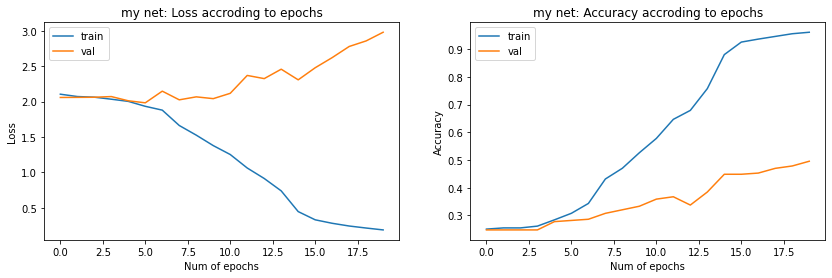

In [ ]:
#model = Net() 
model.to(device)
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
optimizer_ft = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
num_epochs=20
model, dict_res = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)
plot_convergence(dict_res,num_epochs,'my net')

Accuracy didn't improve - we got the same results with 6 conv layers model which has less parameters.  The main problems of all models was high overfitting. There are some ways to tackle it but we actually haven't learned yet :-) 